In [1]:
import pandas as pd
import statistics as stats
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [2]:
healthcare_data=pd.read_csv('healthcare_dataset.csv')

In [3]:
healthcare_data.head()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease
0,56,27.577099,88.0,108.0,92,171,75,0,Medium,9,5,High,Low,No,Disease_B
1,69,26.233744,88.0,252.0,102,179,71,0,High,9,3,High,Medium,Yes,Disease_A
2,46,29.646620,152.0,141.0,89,198,90,1,Low,5,5,Medium,Medium,No,Disease_C
3,32,30.619597,106.0,273.0,159,222,64,1,Medium,7,0,Medium,High,No,Disease_C
4,60,16.794395,96.0,172.0,173,30,99,1,Low,7,3,High,Medium,No,Disease_B


In [4]:
healthcare_data.tail()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease
4995,42,32.859689,174.0,140.0,107,248,90,1,High,10,9,High,High,No,Disease_B
4996,39,37.916078,113.0,184.0,180,200,98,1,High,8,5,High,Low,No,Disease_C
4997,48,32.637416,143.0,188.0,82,77,61,1,High,4,1,Medium,High,Yes,Disease_C
4998,34,31.794482,108.0,141.0,76,117,71,1,High,4,2,Low,Medium,No,NaN
4999,72,24.858529,82.0,219.0,136,203,64,1,High,4,0,Low,High,Yes,Disease_C


In [5]:
healthcare_data.shape

(5000, 15)

### Central Tendency Measures and Stats techniques
Looking toward answering Data Preparation quetsions and Statistical disciplines 
question on (between line 6 to 65)

In [6]:
healthcare_data.describe()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,SleepTime,MedicalHistoryScore
count,5000.000000,4750.000000,4750.000000,4750.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,48.805600,27.332873,129.749053,199.611158,137.440600,146.573200,80.342000,0.510400,7.482200,4.485400
std,17.906991,7.190172,28.671508,58.173633,47.448072,82.623127,13.914919,0.499942,2.281562,2.852405
min,18.000000,15.000291,80.000000,100.000000,70.000000,15.000000,60.000000,0.000000,4.000000,0.000000
25%,34.000000,21.049709,105.000000,149.000000,103.000000,78.000000,70.000000,0.000000,5.000000,2.000000
50%,49.000000,27.218082,130.000000,201.000000,136.000000,144.000000,80.000000,1.000000,7.000000,4.000000
75%,64.000000,33.530189,155.000000,250.000000,167.000000,213.000000,89.000000,1.000000,9.000000,7.000000
max,79.000000,39.988943,179.000000,299.000000,582.000000,744.000000,198.000000,1.000000,11.000000,9.000000


In [7]:
healthcare_data.describe(include='all')

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease
count,5000.000000,4750.000000,4750.000000,4750.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000.000000,5000.000000,5000,5000,5000,3742
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,3,3,2,3
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Medium,NaN,NaN,Low,Low,Yes,Disease_B
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1748,NaN,NaN,1681,1696,2506,1258
mean,48.805600,27.332873,129.749053,199.611158,137.440600,146.573200,80.342000,0.510400,NaN,7.482200,4.485400,NaN,NaN,NaN,NaN
std,17.906991,7.190172,28.671508,58.173633,47.448072,82.623127,13.914919,0.499942,NaN,2.281562,2.852405,NaN,NaN,NaN,NaN
min,18.000000,15.000291,80.000000,100.000000,70.000000,15.000000,60.000000,0.000000,NaN,4.000000,0.000000,NaN,NaN,NaN,NaN
25%,34.000000,21.049709,105.000000,149.000000,103.000000,78.000000,70.000000,0.000000,NaN,5.000000,2.000000,NaN,NaN,NaN,NaN
50%,49.000000,27.218082,130.000000,201.000000,136.000000,144.000000,80.000000,1.000000,NaN,7.000000,4.000000,NaN,NaN,NaN,NaN
75%,64.000000,33.530189,155.000000,250.000000,167.000000,213.000000,89.000000,1.000000,NaN,9.000000,7.000000,NaN,NaN,NaN,NaN


In [8]:
healthcare_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  5000 non-null   int64  
 1   BMI                  4750 non-null   float64
 2   BloodPressure        4750 non-null   float64
 3   Cholesterol          4750 non-null   float64
 4   Glucose              5000 non-null   int64  
 5   Insulin              5000 non-null   int64  
 6   HeartRate            5000 non-null   int64  
 7   Smoker               5000 non-null   int64  
 8   PhysicalActivity     5000 non-null   object 
 9   SleepTime            5000 non-null   int64  
 10  MedicalHistoryScore  5000 non-null   int64  
 11  IncomeLevel          5000 non-null   object 
 12  StressLevel          5000 non-null   object 
 13  HealthIns            5000 non-null   object 
 14  Disease              3742 non-null   object 
dtypes: float64(3), int64(7), object(5)
mem

## Cleaning Data

In [9]:
healthcare_data.isnull().values.any()

True

In [10]:
healthcare_data.isnull().sum()

Age                       0
BMI                     250
BloodPressure           250
Cholesterol             250
Glucose                   0
Insulin                   0
HeartRate                 0
Smoker                    0
PhysicalActivity          0
SleepTime                 0
MedicalHistoryScore       0
IncomeLevel               0
StressLevel               0
HealthIns                 0
Disease                1258
dtype: int64

In [11]:
columns_with_nan = healthcare_data.columns[healthcare_data.isna().any()].tolist()
print(columns_with_nan)

['BMI', 'BloodPressure', 'Cholesterol', 'Disease']


### BMI

In [12]:
healthcare_data['BMI'].unique()

array([27.57709877, 26.23374355, 29.64661971, ..., 32.6374163 ,
       31.79448176, 24.85852866])

In [13]:
BMI_healthcare_data_mean = healthcare_data['BMI'].mean()
BMI_healthcare_data_mean

27.3328732952

In [14]:
healthcare_data['BMI'] = healthcare_data['BMI'].fillna(BMI_healthcare_data_mean)
healthcare_data['BMI']

0       27.577099
1       26.233744
2       29.646620
3       30.619597
4       16.794395
          ...    
4995    32.859689
4996    37.916078
4997    32.637416
4998    31.794482
4999    24.858529
Name: BMI, Length: 5000, dtype: float64

In [15]:
BMI_counts = healthcare_data['BMI'].value_counts()
BMI_counts

BMI
27.332873    250
27.577099      1
38.164635      1
31.660183      1
39.614397      1
            ... 
23.482632      1
16.550919      1
24.445980      1
39.233045      1
24.858529      1
Name: count, Length: 4751, dtype: int64

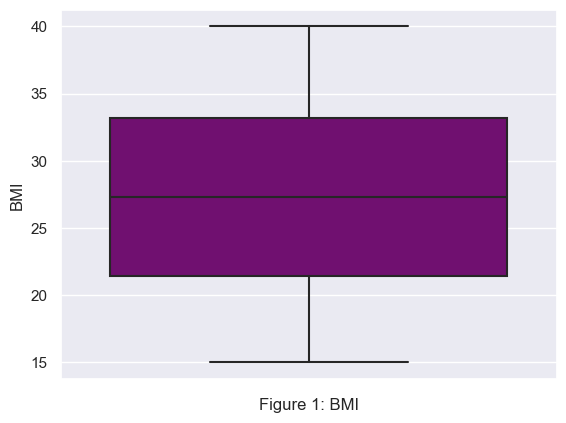

In [16]:
color = 'purple'
High_Value_Purchase_Count_outlier = healthcare_data['BMI']

sns.boxplot(y=High_Value_Purchase_Count_outlier, color=color)
plt.xlabel('Figure 1: BMI')

plt.show()

### BloodPressure

In [17]:
healthcare_data['BloodPressure'].unique()

array([ 88., 152., 106.,  96.,  nan, 124.,  87., 159.,  97., 112.,  80.,
       155.,  85., 120., 134.,  84., 138., 128., 161., 144., 162., 133.,
       140.,  82., 104., 148., 119., 129., 174., 136.,  95., 117.,  86.,
       157., 132., 142., 168., 111., 101., 131., 143., 170.,  92., 151.,
       135.,  91., 178., 165., 108., 118., 179., 177., 125., 146.,  93.,
       102., 173.,  89., 156., 160., 166.,  81., 175., 122.,  83., 167.,
        98., 164., 145., 116., 158., 126., 115., 105., 110., 176., 150.,
       114.,  94., 172., 109., 154., 139., 153., 171., 169., 163., 147.,
       149., 130., 127., 107., 103., 123., 121., 141., 100.,  90.,  99.,
       113., 137.])

In [18]:
BloodPressure_healthcare_data_mean = healthcare_data['BloodPressure'].mean()
BloodPressure_healthcare_data_mean

129.74905263157893

In [19]:
healthcare_data['BloodPressure'] = healthcare_data['BloodPressure'].fillna(BloodPressure_healthcare_data_mean)
healthcare_data['BloodPressure']

0        88.0
1        88.0
2       152.0
3       106.0
4        96.0
        ...  
4995    174.0
4996    113.0
4997    143.0
4998    108.0
4999     82.0
Name: BloodPressure, Length: 5000, dtype: float64

In [20]:
BloodPressure_counts = healthcare_data['BloodPressure'].value_counts()
BloodPressure_counts

BloodPressure
129.749053    250
127.000000     67
159.000000     66
165.000000     65
92.000000      64
             ... 
137.000000     35
177.000000     34
90.000000      33
128.000000     31
154.000000     28
Name: count, Length: 101, dtype: int64

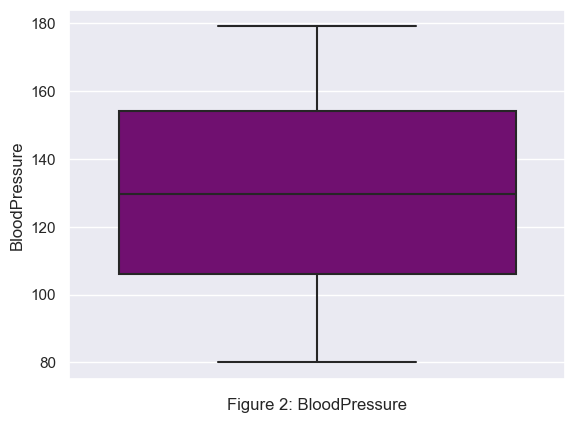

In [21]:
color = 'Purple'
High_Value_Purchase_Count_outlier = healthcare_data['BloodPressure']

sns.boxplot(y=High_Value_Purchase_Count_outlier, color=color)
plt.xlabel('Figure 2: BloodPressure')

plt.show()

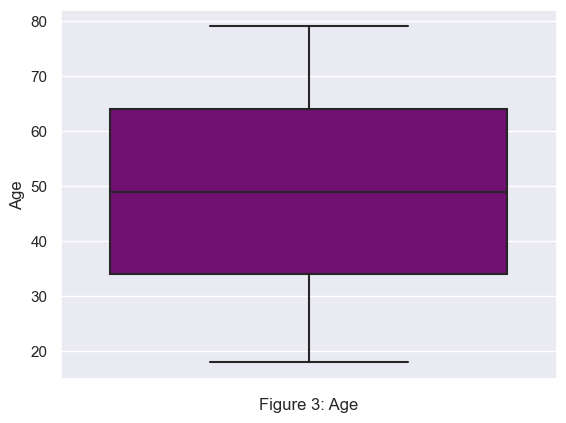

In [22]:
color = 'Purple'
High_Value_Purchase_Count_outlier = healthcare_data['Age']

sns.boxplot(y=High_Value_Purchase_Count_outlier, color=color)
plt.xlabel('Figure 3: Age')

plt.show()

In [23]:
healthcare_data['Cholesterol'].unique()

array([108., 252., 141., 273., 172., 183.,  nan, 120., 249., 256., 162.,
       160., 163., 168., 267., 228., 205., 164., 221., 161., 281., 202.,
       159., 145., 104., 212., 280., 169., 259., 110., 237., 266., 197.,
       130., 111., 207., 179., 265., 166., 293., 151., 232., 238., 124.,
       134., 262., 121., 264., 282., 195., 216., 291., 119., 103., 117.,
       150., 295., 236., 253., 201., 268., 158., 144., 140., 137., 118.,
       113., 226., 248., 242., 102., 136., 115., 241., 106., 233., 114.,
       279., 171., 261., 203., 214., 296., 247., 234., 149., 229., 146.,
       288., 217., 135., 178., 155., 116., 283., 245., 272., 157., 175.,
       109., 184., 230., 182., 208., 143., 297., 231., 192., 271., 219.,
       167., 165., 289., 257., 278., 187., 275., 132., 204., 173., 181.,
       246., 215., 186., 174., 112., 287., 299., 298., 101., 129., 176.,
       276., 213., 122., 196., 199., 154., 294., 107., 227., 131., 152.,
       209., 191., 255., 286., 277., 127., 270., 26

In [24]:
Cholesterol_healthcare_data_mean = healthcare_data['Cholesterol'].mean()
Cholesterol_healthcare_data_mean

199.61115789473683

In [25]:
healthcare_data['Cholesterol'] = healthcare_data['Cholesterol'].fillna(Cholesterol_healthcare_data_mean)
healthcare_data['Cholesterol']

0       108.0
1       252.0
2       141.0
3       273.0
4       172.0
        ...  
4995    140.0
4996    184.0
4997    188.0
4998    141.0
4999    219.0
Name: Cholesterol, Length: 5000, dtype: float64

In [26]:
Cholesterol_counts = healthcare_data['Cholesterol'].value_counts()
Cholesterol_counts

Cholesterol
199.611158    250
271.000000     39
114.000000     39
130.000000     36
211.000000     36
             ... 
239.000000     15
193.000000     15
238.000000     14
200.000000     13
110.000000      8
Name: count, Length: 201, dtype: int64

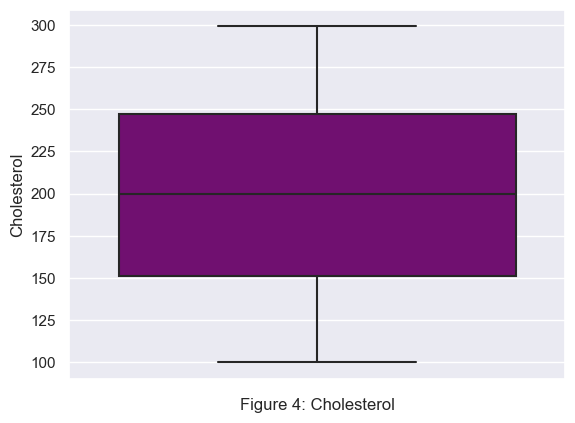

In [27]:
color = 'Purple'
High_Value_Purchase_Count_outlier = healthcare_data['Cholesterol']

sns.boxplot(y=High_Value_Purchase_Count_outlier, color=color)
plt.xlabel('Figure 4: Cholesterol')

plt.show()

In [28]:
healthcare_data['Disease'].unique()

array(['Disease_B', 'Disease_A', 'Disease_C', nan], dtype=object)

In [29]:
Disease_counts = healthcare_data['Disease'].value_counts()
Disease_counts

Disease
Disease_B    1258
Disease_A    1242
Disease_C    1242
Name: count, dtype: int64

In [30]:
healthcare_data['Disease'].fillna('Disease_Unknown', inplace=True)

In [31]:
Disease_counts = healthcare_data['Disease'].value_counts()
Disease_counts

Disease
Disease_B          1258
Disease_Unknown    1258
Disease_A          1242
Disease_C          1242
Name: count, dtype: int64

In [32]:
relative_frequencies_Disease = Disease_counts/len(healthcare_data)
relative_frequencies_Disease

Disease
Disease_B          0.2516
Disease_Unknown    0.2516
Disease_A          0.2484
Disease_C          0.2484
Name: count, dtype: float64

In [33]:
pd.DataFrame({'Disease': Disease_counts.index,
                        'Frequency': Disease_counts.values,
                        'Relative Frequency': relative_frequencies_Disease.values})

,Disease,Frequency,Relative Frequency
0,Disease_B,1258,0.2516
1,Disease_Unknown,1258,0.2516
2,Disease_A,1242,0.2484
3,Disease_C,1242,0.2484


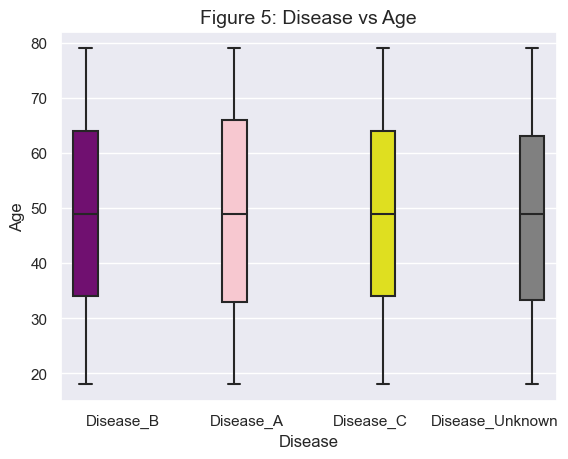

In [34]:
palette = ['purple', 'pink', 'yellow', 'grey']

sns.boxplot(x = 'Disease', y = 'Age', data = healthcare_data, hue = 'Disease', palette=palette)
plt.title('Figure 5: Disease vs Age', fontsize = 14)
plt.legend([], [],frameon = False)
plt.show()

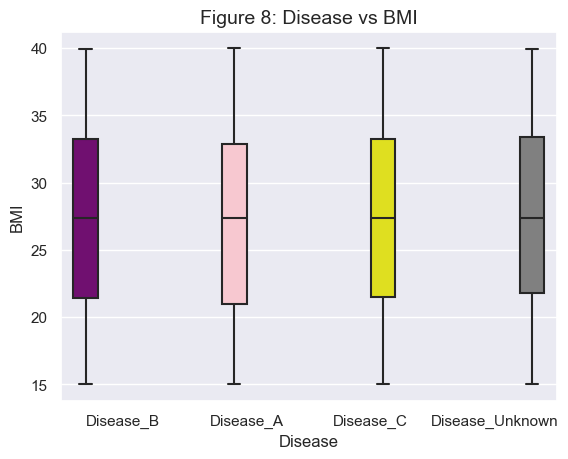

In [35]:
palette = ['purple', 'pink', 'yellow', 'grey']

sns.boxplot(x = 'Disease', y = 'BMI', data = healthcare_data, hue = 'Disease', palette=palette)
plt.title('Figure 8: Disease vs BMI', fontsize = 14)
plt.legend([], [],frameon = False)
plt.show()

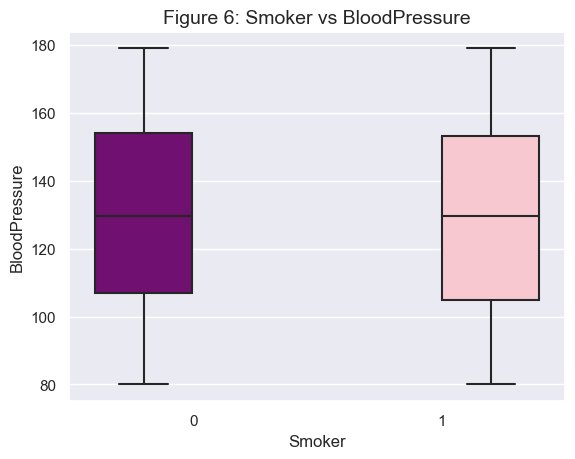

In [36]:
palette = ['purple', 'pink', 'yellow', 'grey']

sns.boxplot(x = 'Smoker', y = 'BloodPressure', data = healthcare_data, hue = 'Smoker', palette=palette)
plt.title('Figure 6: Smoker vs BloodPressure', fontsize = 14)
plt.legend([], [],frameon = False)
plt.show()

In [37]:
healthcare_data.describe(include='object')

,PhysicalActivity,IncomeLevel,StressLevel,HealthIns,Disease
count,5000,5000,5000,5000,5000
unique,3,3,3,2,4
top,Medium,Low,Low,Yes,Disease_B
freq,1748,1681,1696,2506,1258


### HealthIns

In [38]:
healthcare_data['HealthIns'].unique()

array(['No', 'Yes'], dtype=object)

In [39]:
HealthIns_counts = healthcare_data['HealthIns'].value_counts()
HealthIns_counts

HealthIns
Yes    2506
No     2494
Name: count, dtype: int64

In [40]:
relative_frequencies_HealthIns = HealthIns_counts/len(healthcare_data)
relative_frequencies_HealthIns

HealthIns
Yes    0.5012
No     0.4988
Name: count, dtype: float64

In [41]:
pd.DataFrame({'HealthIns': HealthIns_counts.index,
                        'Frequency': HealthIns_counts.values,
                        'Relative Frequency': relative_frequencies_HealthIns.values})

,HealthIns,Frequency,Relative Frequency
0,Yes,2506,0.5012
1,No,2494,0.4988


### PhysicalActivity

In [42]:
healthcare_data['PhysicalActivity'].unique()

array(['Medium', 'High', 'Low'], dtype=object)

In [43]:
HealthIns_counts = healthcare_data['PhysicalActivity'].value_counts()
HealthIns_counts

PhysicalActivity
Medium    1748
High      1635
Low       1617
Name: count, dtype: int64

In [44]:
relative_frequencies_PhysicalActivity = HealthIns_counts/len(healthcare_data)
relative_frequencies_PhysicalActivity

PhysicalActivity
Medium    0.3496
High      0.3270
Low       0.3234
Name: count, dtype: float64

In [45]:
pd.DataFrame({'PhysicalActivity': HealthIns_counts.index,
                        'Frequency': HealthIns_counts.values,
                        'Relative Frequency': relative_frequencies_PhysicalActivity.values})

,PhysicalActivity,Frequency,Relative Frequency
0,Medium,1748,0.3496
1,High,1635,0.3270
2,Low,1617,0.3234


In [46]:
modes = healthcare_data.mode()
print(modes)

    Age        BMI  BloodPressure  Cholesterol  Glucose  Insulin  HeartRate  \
0  77.0  27.332873     129.749053   199.611158    117.0     51.0       89.0   
1   NaN        NaN            NaN          NaN      NaN      NaN        NaN   

   Smoker PhysicalActivity  SleepTime  MedicalHistoryScore IncomeLevel  \
0     1.0           Medium        5.0                  7.0         Low   
1     NaN              NaN        NaN                  NaN         NaN   

  StressLevel HealthIns          Disease  
0         Low       Yes        Disease_B  
1         NaN       NaN  Disease_Unknown  


In [47]:
def identify_variable_types(data):
    categorical_vars = []
    continuous_vars = []

    for var_name, var_data in data.items():
        # Check if the data type is string (categorical) or numeric (continuous)
        if isinstance(var_data[0], str):
            categorical_vars.append(var_name)
        else:
            continuous_vars.append(var_name)

    return categorical_vars, continuous_vars

data = {
    'Age': [25, 30, 45, 40, 50],
    'BMI': [22.5, 24.0, 28.1, 26.7, 30.2],
    'BloodPressure': [120, 125, 130, 128, 135],
    'Cholesterol': [200, 195, 210, 205, 215],
    'Glucose': [85, 90, 95, 100, 105],
    'Insulin': [15, 20, 25, 30, 35],
    'HeartRate': [70, 75, 80, 85, 90],
    'Smoker': ['Yes', 'No'],
    'PhysicalActivity': ['Low', 'Medium', 'High', 'Low', 'Medium'],
    'SleepTime': [7, 6, 8, 5, 6],
    'MedicalHistoryScore': [2, 3, 1, 4, 2],
    'IncomeLevel': ['High', 'Medium', 'Low', 'Medium', 'High'],
    'StressLevel': ['Low', 'Medium', 'High', 'Low', 'High'],
    'HealthIns': ['Yes', 'No', 'Yes', 'No', 'Yes'],
    'Disease': ['Disease_A', 'Disease_B', 'Disease_C', 'Disease_Unknown']
}

categorical_vars, continuous_vars = identify_variable_types(data)
print("Categorical Variables:", categorical_vars)
print("Continuous Variables:", continuous_vars)

Categorical Variables: ['Smoker', 'PhysicalActivity', 'IncomeLevel', 'StressLevel', 'HealthIns', 'Disease']
Continuous Variables: ['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'SleepTime', 'MedicalHistoryScore']


In [48]:
object_features_names = healthcare_data.select_dtypes(include=['object']).columns.tolist()
object_features_names

['PhysicalActivity', 'IncomeLevel', 'StressLevel', 'HealthIns', 'Disease']

In [49]:
healthcare_data.PhysicalActivity = healthcare_data.PhysicalActivity.map({"Low": 0, "Medium":1, "High":2})
healthcare_data.IncomeLevel = healthcare_data.IncomeLevel.map({"Low": 0, "Medium":1, "High":2})
healthcare_data.StressLevel = healthcare_data.StressLevel.map({"Low": 0, "Medium":1, "High":2})
healthcare_data["HealthIns"] = healthcare_data["HealthIns"].map({"No":0,"Yes":1})

### Standardization / LabelEncoder before to do the models:

In [50]:
from sklearn.preprocessing import LabelEncoder

def apply_label_encoding(dataframe, column_name):
 
    encoder = LabelEncoder()
    
    encoded_column = encoder.fit_transform(dataframe['Disease'])
    
    return encoded_column

In [51]:
encoded_disease = apply_label_encoding(healthcare_data, 'Disease')

healthcare_data['Disease_Encoded'] = encoded_disease

In [52]:
healthcare_data.drop(columns=['Disease'], inplace=True)

### OneHotEcoder:

In [53]:
healthcare_data.head()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease_Encoded
0,56,27.577099,88.0,108.0,92,171,75,0,1,9,5,2,0,0,1
1,69,26.233744,88.0,252.0,102,179,71,0,2,9,3,2,1,1,0
2,46,29.646620,152.0,141.0,89,198,90,1,0,5,5,1,1,0,2
3,32,30.619597,106.0,273.0,159,222,64,1,1,7,0,1,2,0,2
4,60,16.794395,96.0,172.0,173,30,99,1,0,7,3,2,1,0,1


In [54]:
from sklearn.preprocessing import OneHotEncoder

y_series = pd.Series(['A', 'B', 'C', 'Unknown'])

y_array = y_series.to_numpy()

encoder = OneHotEncoder()
y_encoded = encoder.fit_transform(y_array.reshape(-1, 1)) 

new_columns = encoder.get_feature_names_out(['Disease_Encoded'])

y_encoded_df = pd.DataFrame(y_encoded.toarray(), columns=new_columns)

y_new = y_encoded_df[new_columns]

print(y_new.head())

   Disease_Encoded_A  Disease_Encoded_B  Disease_Encoded_C  \
0                1.0                0.0                0.0   
1                0.0                1.0                0.0   
2                0.0                0.0                1.0   
3                0.0                0.0                0.0   

   Disease_Encoded_Unknown  
0                      0.0  
1                      0.0  
2                      0.0  
3                      1.0  


In [55]:
healthcare_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  5000 non-null   int64  
 1   BMI                  5000 non-null   float64
 2   BloodPressure        5000 non-null   float64
 3   Cholesterol          5000 non-null   float64
 4   Glucose              5000 non-null   int64  
 5   Insulin              5000 non-null   int64  
 6   HeartRate            5000 non-null   int64  
 7   Smoker               5000 non-null   int64  
 8   PhysicalActivity     5000 non-null   int64  
 9   SleepTime            5000 non-null   int64  
 10  MedicalHistoryScore  5000 non-null   int64  
 11  IncomeLevel          5000 non-null   int64  
 12  StressLevel          5000 non-null   int64  
 13  HealthIns            5000 non-null   int64  
 14  Disease_Encoded      5000 non-null   int32  
dtypes: float64(3), int32(1), int64(11)
mem

In [56]:
healthcare_data.describe()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease_Encoded
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,48.805600,27.332873,129.749053,199.611158,137.440600,146.573200,80.342000,0.510400,1.003600,7.482200,4.485400,0.995800,0.986000,0.501200,1.503200
std,17.906991,7.008076,27.945382,56.700345,47.448072,82.623127,13.914919,0.499942,0.806546,2.281562,2.852405,0.817506,0.815069,0.500049,1.118141
min,18.000000,15.000291,80.000000,100.000000,70.000000,15.000000,60.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34.000000,21.398311,106.000000,151.000000,103.000000,78.000000,70.000000,0.000000,0.000000,5.000000,2.000000,0.000000,0.000000,0.000000,1.000000
50%,49.000000,27.332873,129.749053,199.611158,136.000000,144.000000,80.000000,1.000000,1.000000,7.000000,4.000000,1.000000,1.000000,1.000000,1.500000
75%,64.000000,33.181997,154.000000,247.000000,167.000000,213.000000,89.000000,1.000000,2.000000,9.000000,7.000000,2.000000,2.000000,1.000000,3.000000
max,79.000000,39.988943,179.000000,299.000000,582.000000,744.000000,198.000000,1.000000,2.000000,11.000000,9.000000,2.000000,2.000000,1.000000,3.000000


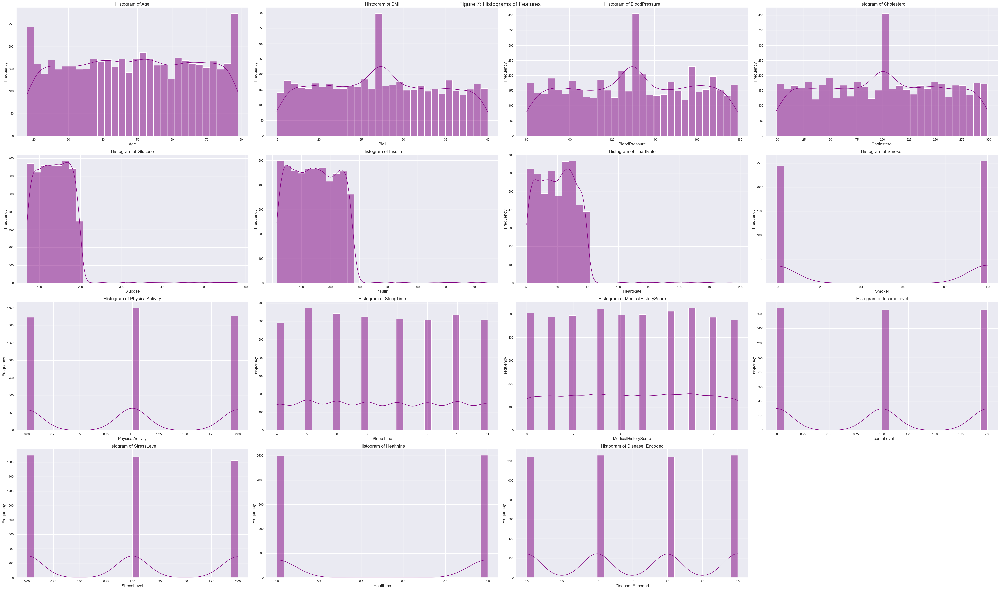

In [57]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

features = healthcare_data.columns.tolist()

num_features = len(features)
num_cols = 4
num_rows = math.ceil(num_features / num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(50, 30))  

axes = axes.flatten()

colors = ['purple'] 

for i, feature in enumerate(features):
    if i < num_features:  
        sns.histplot(healthcare_data[feature], kde=True, bins=30, color=colors[i % len(colors)], ax=axes[i])
        axes[i].set_title(f'Histogram of {feature}', fontsize=16)
        axes[i].set_xlabel(feature, fontsize=15)
        axes[i].set_ylabel('Frequency', fontsize=15)

for j in range(i+1, num_rows*num_cols):
    fig.delaxes(axes[j])

plt.suptitle("Figure 7: Histograms of Features", fontsize=20)  

plt.tight_layout()

plt.show()

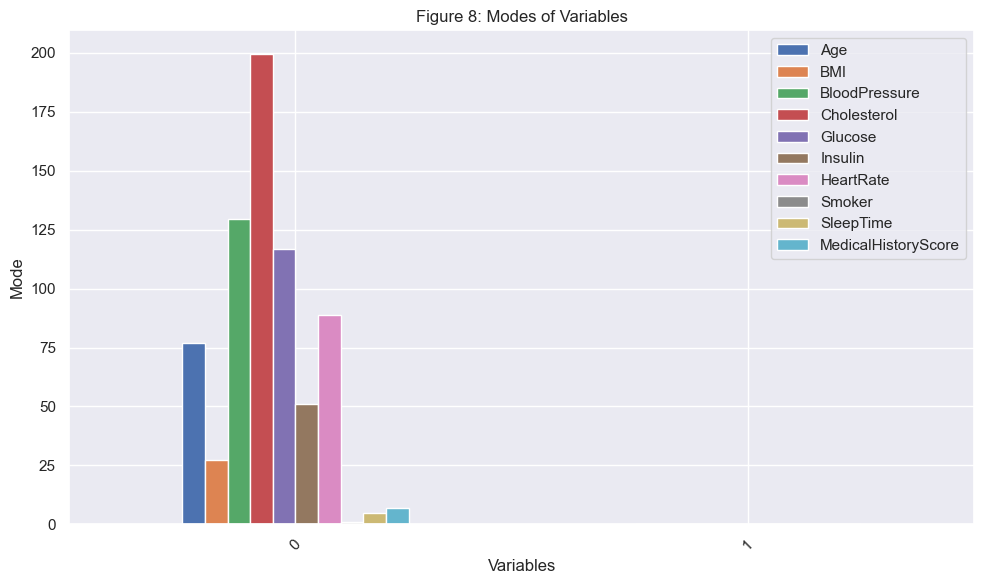

In [58]:
modes.plot(kind='bar', figsize=(10, 6))
plt.title('Figure 8: Modes of Variables')
plt.xlabel('Variables')
plt.ylabel('Mode')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [59]:
column_names = healthcare_data.columns.tolist()
print(column_names)

['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'Smoker', 'PhysicalActivity', 'SleepTime', 'MedicalHistoryScore', 'IncomeLevel', 'StressLevel', 'HealthIns', 'Disease_Encoded']


In [60]:
# Plotting multiple bar charts at once for categorical variables
# Since there is no default function which can plot bar charts for multiple columns at once
# we are defining our own function for the same

def PlotBarCharts(inpData, colsToPlot):
    # Generating multiple subplots
    fig, subPlot=plt.subplots(nrows=1, ncols=len(colsToPlot), figsize=(20,5))
    fig.suptitle('Bar charts of: '+ str(colsToPlot))

    for colName, plotNumber in zip(colsToPlot, range(len(colsToPlot))):
        inpData.groupby(colName).size().plot(kind='bar',ax=subPlot[plotNumber])

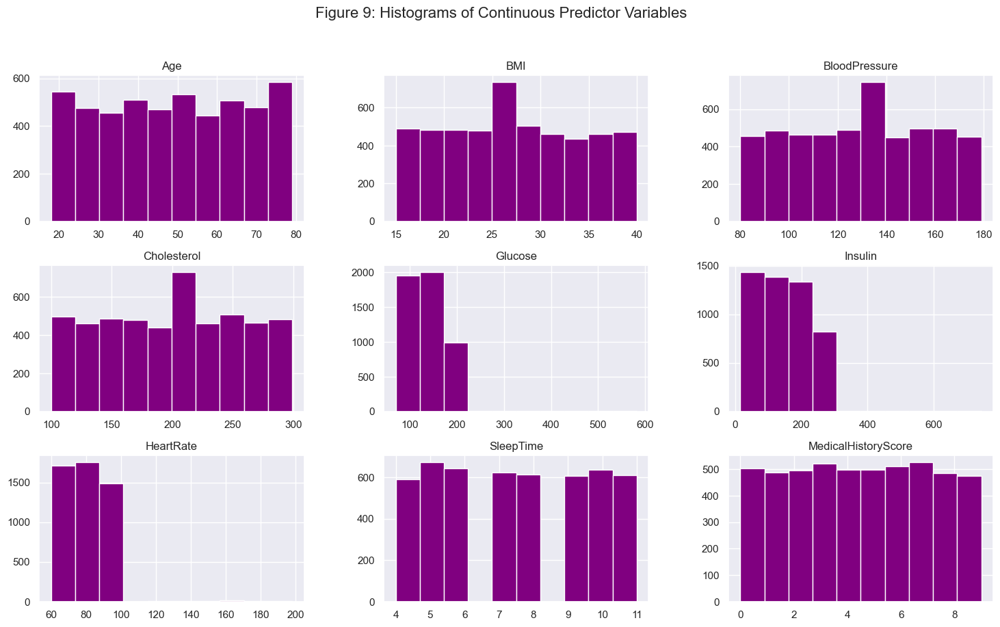

In [61]:
healthcare_data.hist(['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'SleepTime', 'MedicalHistoryScore'], figsize=(18, 10), color='purple')
plt.suptitle('Figure 9: Histograms of Continuous Predictor Variables', fontsize=16)
plt.show()

In [62]:
mean = np.mean(healthcare_data)
mean

52.48815225476772

In [63]:
median = np.median(healthcare_data)
median

8.0

In [64]:
mode = stats.mode(healthcare_data)
mode

'Age'

Looking forward on you will be able to see Machine Learning and Statistical techniques:

## Training and Test:

In [65]:
X = healthcare_data.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]].values
y = healthcare_data.iloc[:, 14].values

In [66]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
y

array([1, 0, 2, ..., 2, 3, 2])

### Normalization

In [68]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X_train = sc.fit_transform(X_train)

X_test = sc.transform(X_test)

In [69]:
healthcare_data.shape

(5000, 15)

# LDA
#### Reduce the dimensionality:

In [70]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [71]:
lda=LinearDiscriminantAnalysis()
X_lda=lda.fit_transform(X,y)

In [72]:
X_lda.shape

(5000, 3)

In [73]:
import numpy as np

classes = np.unique(y)
num_classes = len(classes)

print("number of classes:", num_classes)
print("Classes:", classes)

number of classes: 4
Classes: [0 1 2 3]


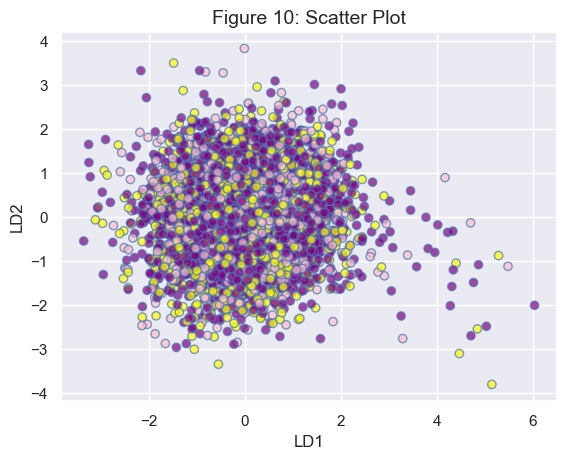

In [74]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

colors = ['Purple', 'Purple', 'pink', 'yellow']

custom_cmap = ListedColormap(colors)

plt.xlabel('LD1')
plt.ylabel('LD2')
plt.scatter(x=X_lda[:, 0],
           y=X_lda[:, 1],
           c=y,
           cmap=custom_cmap, 
           alpha=0.7,
           edgecolors='b')

plt.title('Figure 10: Scatter Plot', fontsize=14)
plt.show()

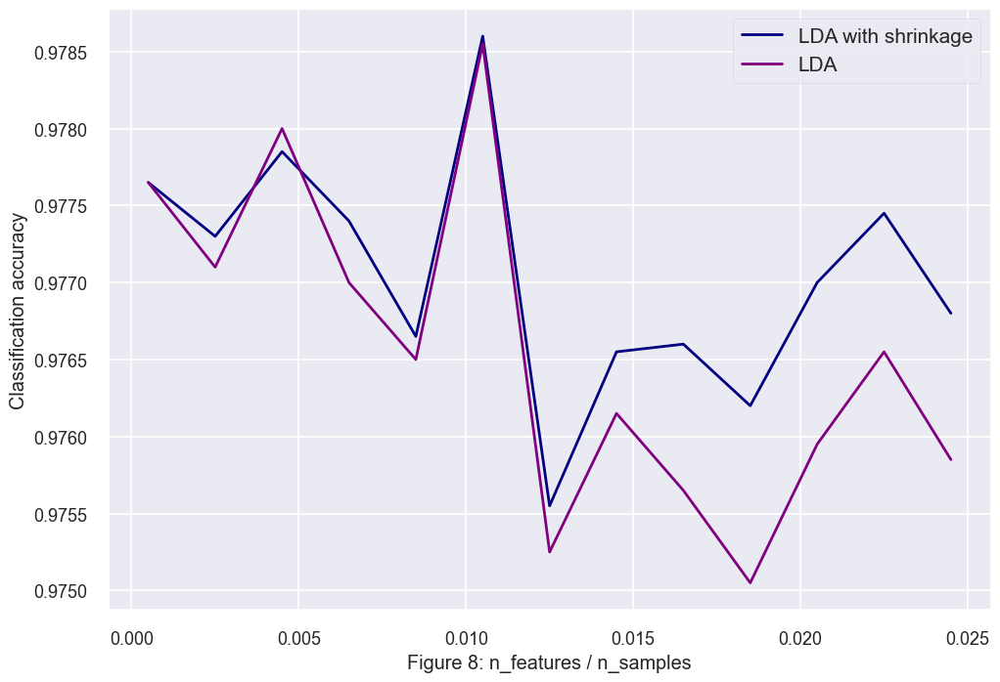

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
%matplotlib inline

n_train = 2000  
n_test = 400  
n_averages = 50  
n_features_max = 50  
step = 4 


def generate_data(n_samples, n_features):
    X, y = make_blobs(n_samples=n_samples, n_features=4, centers=[[-2], [2]])

    if n_features > 1:
        X = np.hstack([X, np.random.randn(n_samples, n_features - 1)])
    return X, y

acc_clf1, acc_clf2 = [], []
n_features_range = range(1, n_features_max + 1, step)
for n_features in n_features_range:
    score_clf1, score_clf2 = 0, 0
    for _ in range(n_averages):
        X, y = generate_data(n_train, n_features)

        clf1 = LinearDiscriminantAnalysis(solver='lsqr', shrinkage=0.5).fit(X, y)
        clf2 = LinearDiscriminantAnalysis(solver='lsqr', shrinkage=None).fit(X, y)

        X, y = generate_data(n_test, n_features)
        score_clf1 += clf1.score(X, y)
        score_clf2 += clf2.score(X, y)

    acc_clf1.append(score_clf1 / n_averages)
    acc_clf2.append(score_clf2 / n_averages)

features_samples_ratio = np.array(n_features_range) / n_train

with plt.style.context('seaborn-talk'):
    plt.plot(features_samples_ratio, acc_clf1, linewidth=2,
             label="LDA with shrinkage", color='navy')
    plt.plot(features_samples_ratio, acc_clf2, linewidth=2,
             label="LDA", color='Purple')

    plt.xlabel('Figure 8: n_features / n_samples')
    plt.ylabel('Classification accuracy')
    plt.legend(prop={'size': 15})
    plt.tight_layout()

## Superviser Learning

# PCA:

In [76]:
healthcare_data_no_label=healthcare_data.drop(columns=['Disease_Encoded'])

In [77]:
healthcare_data_no_label.head()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns
0,56,27.577099,88.0,108.0,92,171,75,0,1,9,5,2,0,0
1,69,26.233744,88.0,252.0,102,179,71,0,2,9,3,2,1,1
2,46,29.646620,152.0,141.0,89,198,90,1,0,5,5,1,1,0
3,32,30.619597,106.0,273.0,159,222,64,1,1,7,0,1,2,0
4,60,16.794395,96.0,172.0,173,30,99,1,0,7,3,2,1,0


In [78]:
pca = PCA().fit(healthcare_data_no_label)

Text(0, 0.5, 'Cumulative explained variance')

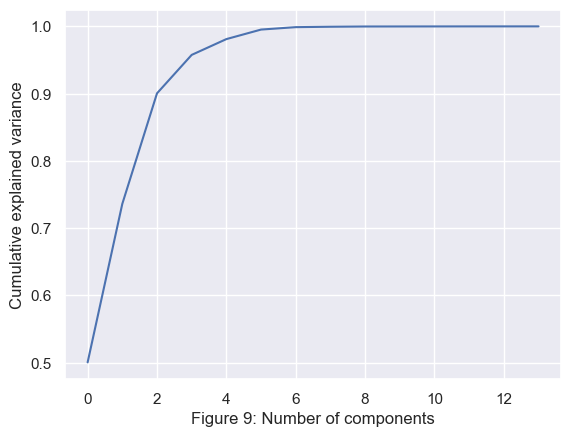

In [79]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Figure 9: Number of components')
plt.ylabel('Cumulative explained variance')

In [80]:
pca = PCA(6)

In [81]:
projected = pca.fit_transform(healthcare_data_no_label)

In [82]:
projected.shape

(5000, 6)

In [83]:
projected

array([[ 25.59576095, -94.00709585, -39.61968714,  41.57060256,
         -7.60895516,  -5.36967906],
       [ 33.26578651,  50.40072535, -37.23179142,  42.15109638,
        -19.95197537,  -9.07011066],
       [ 53.22699134, -61.02717393, -43.34036803, -22.11897676,
          2.60679297,   9.54239748],
       ...,
       [-67.42290317, -14.63478288, -57.03824738, -13.92434539,
          1.29370635, -19.76076155],
       [-27.5624108 , -62.03964721, -59.10288259,  21.25090896,
         14.84218338,  -9.51969635],
       [ 56.02372357,  19.33317278,  -0.686993  ,  48.3239965 ,
        -23.2993867 , -15.96625658]])

In [84]:
healthcare_data_pca = pd.DataFrame(projected, columns=['C1', 'C2', 'C3', 'C4', 'C5', 'C6'])

In [85]:
healthcare_data_pca.head()

,C1,C2,C3,C4,C5,C6
0,25.595761,-94.007096,-39.619687,41.570603,-7.608955,-5.369679
1,33.265787,50.400725,-37.231791,42.151096,-19.951975,-9.070111
2,53.226991,-61.027174,-43.340368,-22.118977,2.606793,9.542397
3,74.534389,74.435426,20.222884,24.823298,16.858585,-15.652642
4,-118.121290,-25.928894,32.784371,32.577985,-11.289271,18.294441


In [86]:
healthcare_data_pca['Disease_Encoded']=healthcare_data['Disease_Encoded']

In [87]:
healthcare_data_pca.head()

,C1,C2,C3,C4,C5,C6,Disease_Encoded
0,25.595761,-94.007096,-39.619687,41.570603,-7.608955,-5.369679,1
1,33.265787,50.400725,-37.231791,42.151096,-19.951975,-9.070111,0
2,53.226991,-61.027174,-43.340368,-22.118977,2.606793,9.542397,2
3,74.534389,74.435426,20.222884,24.823298,16.858585,-15.652642,2
4,-118.121290,-25.928894,32.784371,32.577985,-11.289271,18.294441,1


In [88]:
healthcare_data_array = healthcare_data_pca.values

In [89]:
healthcare_data_array

array([[ 25.59576095, -94.00709585, -39.61968714, ...,  -7.60895516,
         -5.36967906,   1.        ],
       [ 33.26578651,  50.40072535, -37.23179142, ..., -19.95197537,
         -9.07011066,   0.        ],
       [ 53.22699134, -61.02717393, -43.34036803, ...,   2.60679297,
          9.54239748,   2.        ],
       ...,
       [-67.42290317, -14.63478288, -57.03824738, ...,   1.29370635,
        -19.76076155,   2.        ],
       [-27.5624108 , -62.03964721, -59.10288259, ...,  14.84218338,
         -9.51969635,   3.        ],
       [ 56.02372357,  19.33317278,  -0.686993  , ..., -23.2993867 ,
        -15.96625658,   2.        ]])

In [90]:
from sklearn.model_selection import train_test_split
X = healthcare_data_array[:,0:6]
y = healthcare_data_array[:,6]

X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=0.20, random_state=42)

In [91]:
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

In [92]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear', multi_class='ovr')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

In [93]:
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))

LR: 0.257500 (0.016696)
LDA: 0.255750 (0.013650)
KNN: 0.245500 (0.022299)
CART: 0.259500 (0.023125)
NB: 0.246250 (0.022199)
SVM: 0.253500 (0.001225)


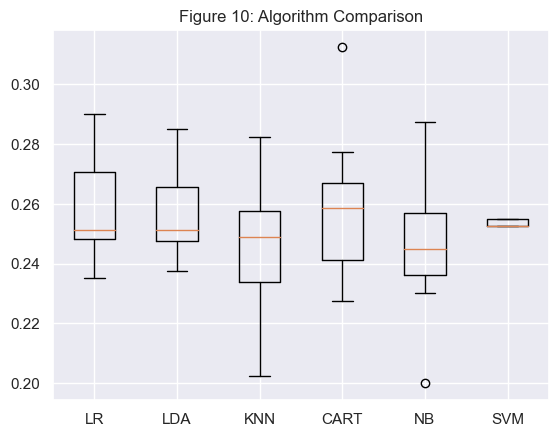

In [94]:
pyplot.boxplot(results, labels=names)
pyplot.title('Figure 10: Algorithm Comparison')
pyplot.show()

In [95]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

model = LogisticRegression()
model.fit(X_train, Y_train)
predictions = model.predict(X_validation)

print(accuracy_score(Y_validation, predictions))
print(confusion_matrix(Y_validation, predictions))

0.231
[[71 58 71 28]
 [97 52 78 39]
 [91 44 67 38]
 [89 59 77 41]]


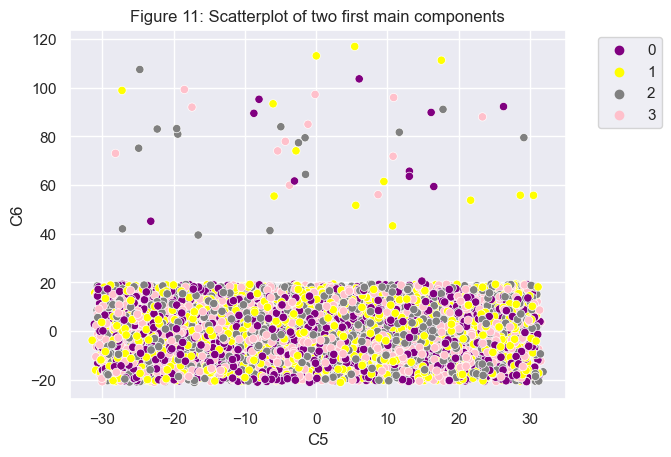

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

custom_palette = ["purple", "yellow", "grey", "pink"]

sns.scatterplot(data=healthcare_data_pca, x='C5', y='C6', hue='Disease_Encoded', palette=custom_palette)

plt.title('Figure 11: Scatterplot of two first main components')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

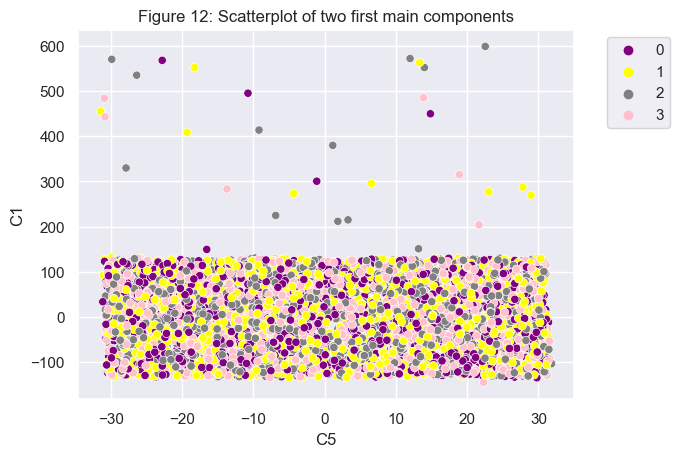

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

custom_palette = ["purple", "yellow", "grey", "pink"]

sns.scatterplot(data=healthcare_data_pca, x='C5', y='C1', hue='Disease_Encoded', palette=custom_palette)

plt.title('Figure 12: Scatterplot of two first main components')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

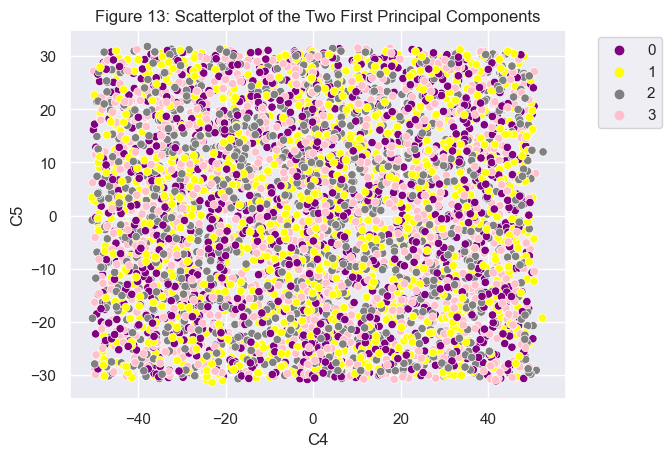

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

custom_palette = ["purple", "yellow", "grey", "pink"]

sns.scatterplot(data=healthcare_data_pca, x='C4', y='C5', hue='Disease_Encoded', palette=custom_palette)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Figure 13: Scatterplot of the Two First Principal Components')
plt.show()

## Classification:

#### Splitting into set 10%

In [99]:
from sklearn.model_selection import train_test_split  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10, random_state = 102)

In [100]:
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape )

Total number of rows and columns for the complete dataset:  (5000, 6) (5000,)
Number of rows and columns after splitting dataset:  (4500, 6) (500, 6) (4500,) (500,)


In [101]:
from sklearn.naive_bayes import GaussianNB

nvclassifier = GaussianNB()

nvclassifier.fit(X_train, y_train)

GaussianNB()

In [102]:
y_pred = nvclassifier.predict(X_test)

print(y_pred)

[1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 3.
 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 2. 1. 1. 0. 1. 0. 1. 1.
 0. 1. 1. 1. 2. 1. 1. 3. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 2. 1. 3. 0. 1.
 1. 1. 1. 3. 1. 0. 1. 0. 1. 0. 0. 1. 1. 3. 2. 1. 3. 1. 1. 1. 1. 1. 0. 1.
 2. 2. 1. 1. 0. 0. 1. 1. 3. 3. 1. 2. 2. 1. 1. 2. 0. 2. 1. 0. 1. 3. 0. 1.
 2. 0. 2. 1. 1. 0. 1. 0. 0. 2. 2. 1. 0. 1. 1. 1. 1. 0. 1. 2. 3. 1. 1. 1.
 1. 1. 2. 1. 0. 3. 1. 2. 3. 3. 1. 0. 3. 1. 1. 1. 1. 1. 2. 2. 0. 1. 1. 2.
 1. 1. 2. 0. 1. 1. 1. 0. 1. 0. 1. 2. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 2. 0.
 1. 1. 3. 1. 0. 1. 1. 1. 1. 2. 1. 1. 1. 3. 1. 1. 3. 1. 1. 1. 1. 1. 1. 2.
 1. 1. 1. 1. 1. 2. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 2. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 3. 1. 2. 1. 1.
 3. 3. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 2. 1. 1. 1. 1. 3. 0. 1. 1.
 0. 1. 1. 1. 1. 1. 3. 1. 1. 1. 1. 0. 2. 3. 1. 1. 0. 1. 1. 2. 1. 0. 0. 2.
 1. 1. 0. 0. 1. 1. 1. 2. 1. 2. 1. 1. 0. 1. 1. 0. 1.

In [103]:
y_compare = np.vstack((y_test,y_pred)).T
y_compare[:,:]

array([[1., 1.],
       [3., 1.],
       [3., 1.],
       [1., 0.],
       [2., 0.],
       [1., 1.],
       [3., 1.],
       [2., 0.],
       [3., 1.],
       [2., 1.],
       [3., 0.],
       [2., 1.],
       [1., 1.],
       [0., 0.],
       [0., 1.],
       [2., 1.],
       [0., 1.],
       [0., 0.],
       [3., 1.],
       [1., 1.],
       [3., 1.],
       [2., 1.],
       [3., 1.],
       [1., 3.],
       [2., 0.],
       [0., 1.],
       [3., 1.],
       [2., 1.],
       [3., 1.],
       [1., 1.],
       [0., 0.],
       [3., 1.],
       [0., 1.],
       [3., 1.],
       [2., 1.],
       [3., 1.],
       [3., 0.],
       [0., 1.],
       [0., 0.],
       [0., 0.],
       [0., 2.],
       [3., 1.],
       [0., 1.],
       [1., 0.],
       [2., 1.],
       [3., 0.],
       [1., 1.],
       [1., 1.],
       [0., 0.],
       [2., 1.],
       [3., 1.],
       [2., 1.],
       [0., 2.],
       [0., 1.],
       [0., 1.],
       [0., 3.],
       [0., 1.],
       [0., 1.],
       [2., 0.

In [104]:
from sklearn.metrics import accuracy_score
score = accuracy_score(y_test, y_pred)
print(score)

0.266


### Confusion Matrix

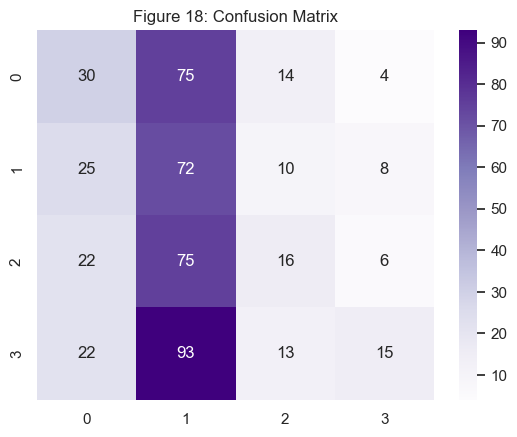

[[30 75 14  4]
 [25 72 10  8]
 [22 75 16  6]
 [22 93 13 15]] (4, 4)


In [105]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)

custom_palette = sns.color_palette("Purples", as_cmap=True)

ax = sns.heatmap(cm, annot=True, cmap=custom_palette)

ax.set_title('Figure 18: Confusion Matrix')

plt.show()

print(cm, cm.shape)

In [106]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.30      0.24      0.27       123
         1.0       0.23      0.63      0.33       115
         2.0       0.30      0.13      0.19       119
         3.0       0.45      0.10      0.17       143

    accuracy                           0.27       500
   macro avg       0.32      0.28      0.24       500
weighted avg       0.33      0.27      0.24       500



In [107]:
from sklearn.model_selection import cross_val_score

nvclassifier = GaussianNB()

cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = 40).mean()

0.2406

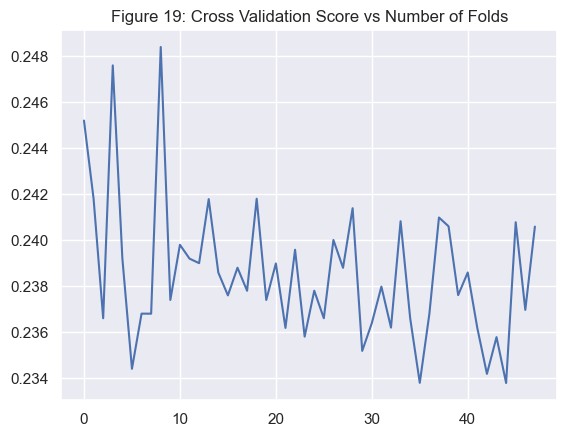

In [108]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())

plt.title('Figure 19: Cross Validation Score vs Number of Folds')
plt.plot(list)

#### Splitting into set 20%

In [109]:
from sklearn.model_selection import train_test_split  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 102)

In [110]:
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape )

Total number of rows and columns for the complete dataset:  (5000, 6) (5000,)
Number of rows and columns after splitting dataset:  (4000, 6) (1000, 6) (4000,) (1000,)


In [111]:
from sklearn.naive_bayes import GaussianNB

nvclassifier = GaussianNB()

nvclassifier.fit(X_train, y_train)

GaussianNB()

In [112]:
y_pred = nvclassifier.predict(X_test)

print(y_pred)

[2. 2. 2. 0. 0. 3. 2. 2. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 3.
 0. 1. 1. 2. 1. 1. 0. 1. 1. 1. 1. 1. 3. 1. 1. 0. 2. 1. 2. 3. 2. 0. 2. 1.
 0. 1. 2. 1. 2. 1. 1. 0. 1. 1. 0. 0. 2. 1. 1. 3. 1. 1. 1. 2. 1. 3. 1. 1.
 1. 1. 1. 3. 1. 0. 1. 0. 1. 0. 0. 1. 1. 3. 2. 1. 1. 1. 3. 2. 1. 1. 0. 1.
 0. 2. 1. 1. 0. 3. 1. 1. 3. 2. 1. 2. 2. 1. 1. 0. 2. 2. 1. 2. 1. 0. 0. 1.
 2. 0. 2. 1. 1. 0. 1. 0. 0. 2. 2. 1. 2. 1. 1. 1. 1. 0. 1. 2. 3. 1. 1. 1.
 1. 1. 2. 1. 0. 3. 1. 2. 3. 3. 1. 0. 3. 1. 1. 1. 1. 1. 2. 2. 3. 1. 1. 2.
 1. 2. 2. 0. 3. 1. 1. 0. 1. 2. 1. 2. 2. 1. 1. 1. 2. 1. 1. 0. 1. 0. 2. 0.
 2. 1. 3. 2. 0. 1. 1. 3. 1. 2. 1. 1. 3. 3. 2. 1. 1. 1. 1. 1. 1. 2. 2. 2.
 1. 1. 1. 1. 1. 2. 1. 0. 1. 1. 1. 3. 1. 2. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 2. 1. 0. 2. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 2. 1. 3.
 2. 3. 1. 1. 1. 3. 3. 0. 2. 1. 3. 1. 0. 1. 1. 2. 3. 1. 1. 1. 3. 0. 3. 1.
 0. 1. 1. 1. 2. 1. 3. 1. 1. 1. 1. 3. 2. 3. 1. 1. 0. 1. 1. 2. 1. 0. 2. 1.
 2. 1. 2. 0. 1. 1. 1. 2. 1. 1. 2. 2. 0. 1. 1. 0. 1.

In [113]:
y_compare = np.vstack((y_test,y_pred)).T
y_compare[:,:]

array([[1., 2.],
       [3., 2.],
       [3., 2.],
       ...,
       [0., 2.],
       [1., 1.],
       [1., 2.]])

In [114]:
from sklearn.metrics import accuracy_score
score = accuracy_score(y_test, y_pred)
print(score)

0.245


### Confusion Matrix

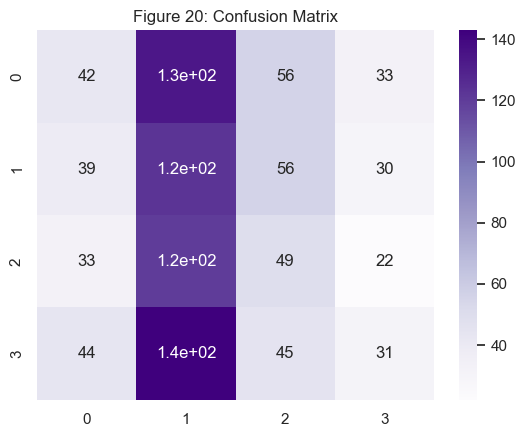

[[ 42 134  56  33]
 [ 39 123  56  30]
 [ 33 120  49  22]
 [ 44 143  45  31]] (4, 4)


In [115]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)

custom_palette = sns.color_palette("Purples", as_cmap=True)

heatmap = sns.heatmap(cm, annot=True, cmap=custom_palette)

heatmap.set_title('Figure 20: Confusion Matrix')

plt.show()

print(cm, cm.shape)

In [116]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.27      0.16      0.20       265
         1.0       0.24      0.50      0.32       248
         2.0       0.24      0.22      0.23       224
         3.0       0.27      0.12      0.16       263

    accuracy                           0.24      1000
   macro avg       0.25      0.25      0.23      1000
weighted avg       0.25      0.24      0.23      1000



In [117]:
from sklearn.model_selection import cross_val_score

nvclassifier = GaussianNB()

cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = 40).mean()

0.2406

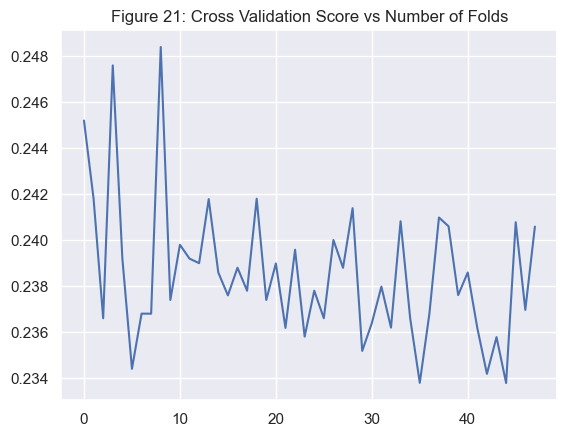

In [118]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())

plt.title('Figure 21: Cross Validation Score vs Number of Folds')
plt.plot(list)

#### Splitting into set 30%

In [119]:
from sklearn.model_selection import train_test_split  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 102)

In [120]:
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape )

Total number of rows and columns for the complete dataset:  (5000, 6) (5000,)
Number of rows and columns after splitting dataset:  (4000, 6) (1000, 6) (4000,) (1000,)


In [121]:
from sklearn.naive_bayes import GaussianNB

nvclassifier = GaussianNB()

nvclassifier.fit(X_train, y_train)

GaussianNB()

In [122]:
y_pred = nvclassifier.predict(X_test)

print(y_pred)

[2. 2. 2. 0. 0. 3. 2. 2. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 3.
 0. 1. 1. 2. 1. 1. 0. 1. 1. 1. 1. 1. 3. 1. 1. 0. 2. 1. 2. 3. 2. 0. 2. 1.
 0. 1. 2. 1. 2. 1. 1. 0. 1. 1. 0. 0. 2. 1. 1. 3. 1. 1. 1. 2. 1. 3. 1. 1.
 1. 1. 1. 3. 1. 0. 1. 0. 1. 0. 0. 1. 1. 3. 2. 1. 1. 1. 3. 2. 1. 1. 0. 1.
 0. 2. 1. 1. 0. 3. 1. 1. 3. 2. 1. 2. 2. 1. 1. 0. 2. 2. 1. 2. 1. 0. 0. 1.
 2. 0. 2. 1. 1. 0. 1. 0. 0. 2. 2. 1. 2. 1. 1. 1. 1. 0. 1. 2. 3. 1. 1. 1.
 1. 1. 2. 1. 0. 3. 1. 2. 3. 3. 1. 0. 3. 1. 1. 1. 1. 1. 2. 2. 3. 1. 1. 2.
 1. 2. 2. 0. 3. 1. 1. 0. 1. 2. 1. 2. 2. 1. 1. 1. 2. 1. 1. 0. 1. 0. 2. 0.
 2. 1. 3. 2. 0. 1. 1. 3. 1. 2. 1. 1. 3. 3. 2. 1. 1. 1. 1. 1. 1. 2. 2. 2.
 1. 1. 1. 1. 1. 2. 1. 0. 1. 1. 1. 3. 1. 2. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 2. 1. 0. 2. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 2. 1. 3.
 2. 3. 1. 1. 1. 3. 3. 0. 2. 1. 3. 1. 0. 1. 1. 2. 3. 1. 1. 1. 3. 0. 3. 1.
 0. 1. 1. 1. 2. 1. 3. 1. 1. 1. 1. 3. 2. 3. 1. 1. 0. 1. 1. 2. 1. 0. 2. 1.
 2. 1. 2. 0. 1. 1. 1. 2. 1. 1. 2. 2. 0. 1. 1. 0. 1.

In [123]:
y_compare = np.vstack((y_test,y_pred)).T
y_compare[:,:]

array([[1., 2.],
       [3., 2.],
       [3., 2.],
       ...,
       [0., 2.],
       [1., 1.],
       [1., 2.]])

In [124]:
from sklearn.metrics import accuracy_score
score = accuracy_score(y_test, y_pred)
print(score)

0.245


### Confusion Matrix

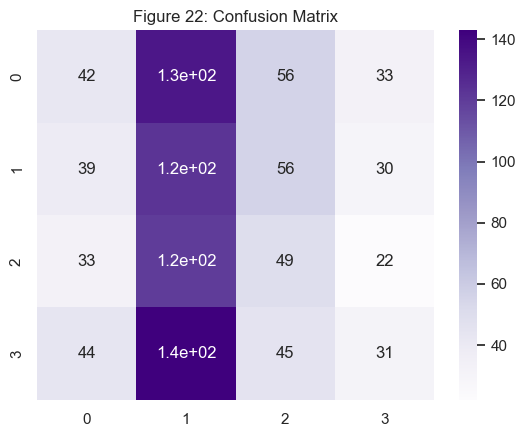

[[ 42 134  56  33]
 [ 39 123  56  30]
 [ 33 120  49  22]
 [ 44 143  45  31]] (4, 4)


In [125]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)

custom_palette = sns.color_palette("Purples", as_cmap=True)

sns.heatmap(cm, annot=True, cmap=custom_palette)
plt.title('Figure 22: Confusion Matrix')

plt.show()

print(cm, cm.shape)

In [126]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.27      0.16      0.20       265
         1.0       0.24      0.50      0.32       248
         2.0       0.24      0.22      0.23       224
         3.0       0.27      0.12      0.16       263

    accuracy                           0.24      1000
   macro avg       0.25      0.25      0.23      1000
weighted avg       0.25      0.24      0.23      1000



In [127]:
from sklearn.model_selection import cross_val_score

nvclassifier = GaussianNB()

cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = 40).mean()

0.2406

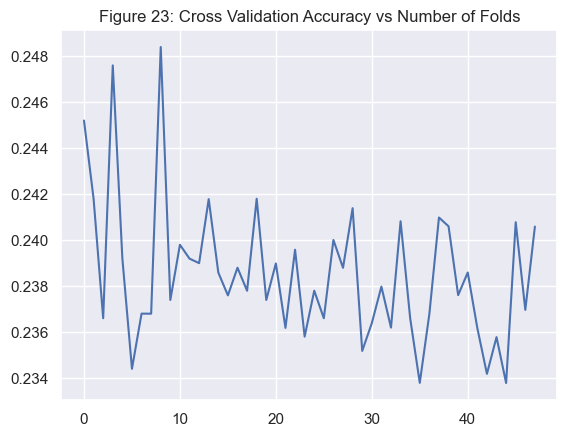

In [128]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())

plt.title('Figure 23: Cross Validation Accuracy vs Number of Folds')
plt.plot(list)

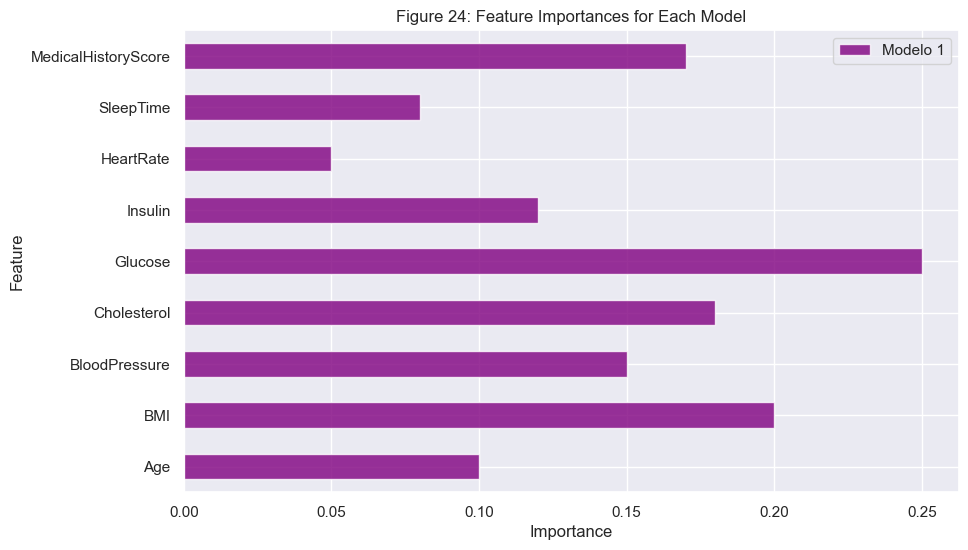

In [129]:
import pandas as pd
import matplotlib.pyplot as plt

models_importances = {"Modelo 1": [0.1, 0.2, 0.15, 0.18, 0.25, 0.12, 0.05, 0.08, 0.17]}

index = ['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'SleepTime', 'MedicalHistoryScore']

plt.figure(figsize=(10, 6))
for model, importances in models_importances.items():
    feature_importances = pd.Series(importances, index=index)
    feature_importances.plot(kind='barh', label=model, alpha=0.8, color='purple')  

plt.title('Figure 24: Feature Importances for Each Model')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.legend()
plt.grid(True)
plt.show()

### Logistic Regression

In [130]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10, random_state = 0)

In [131]:
clf = LogisticRegression(C=1,penalty='l2', solver='newton-cg')

print(clf)

LogisticRegression(C=1, solver='newton-cg')


In [132]:
LOG = clf.fit(X_train,y_train)
prediction = LOG.predict(X_test)

In [133]:
from sklearn import metrics

print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.28      0.25      0.27       131
         1.0       0.24      0.38      0.29       125
         2.0       0.32      0.18      0.23       122
         3.0       0.20      0.20      0.20       122

    accuracy                           0.25       500
   macro avg       0.26      0.25      0.25       500
weighted avg       0.26      0.25      0.25       500



### Confusion Matrix

In [134]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[33 50 15 33]
 [30 47 14 34]
 [27 44 22 29]
 [26 54 18 24]]


In [135]:
LOG.classes_

array([0., 1., 2., 3.])

In [136]:
mapping = {0:'Disease_A', 1:'Disease_B', 2:'Disease_C', 3:'Disease_Unknown'}
classesMapped = [mapping.get(value, value) for value in clf.classes_]
classesMapped

['Disease_A', 'Disease_B', 'Disease_C', 'Disease_Unknown']

Accuracy for Logistic Regression: 0.252
Confusion Matrix for Logistic Regression:
[[33 50 15 33]
 [30 47 14 34]
 [27 44 22 29]
 [26 54 18 24]]


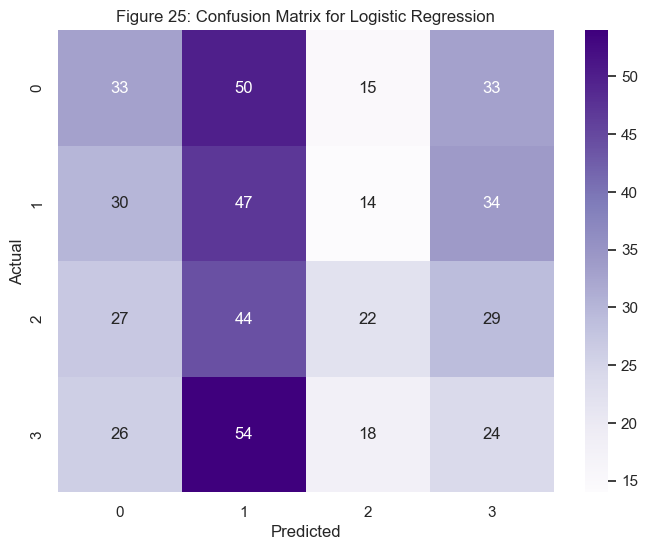

In [137]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy for Logistic Regression: {accuracy}")

cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix for Logistic Regression:\n{cm}")

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Purples')
plt.title("Figure 25: Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

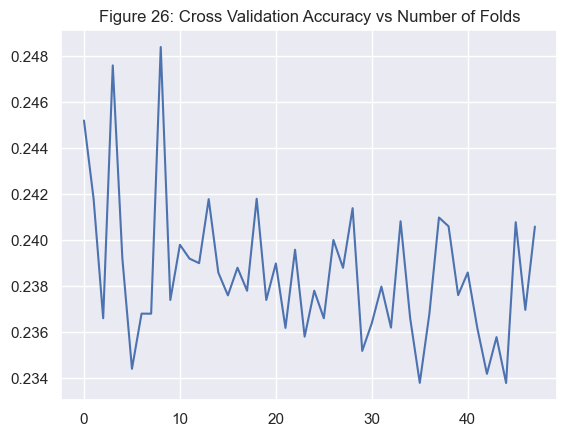

In [138]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())
plt.title('Figure 26: Cross Validation Accuracy vs Number of Folds')
plt.plot(list)

In [139]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 0.25


In [140]:
# Running 10-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(LOG, X , y, cv=10, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.23949238 0.25510666 0.26509302 0.26343616 0.21591045 0.23977265
 0.22037248 0.22598356 0.25358958 0.27975009]

Final Average Accuracy of the model: 0.25


#### Splitting into set 20%

In [141]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [142]:
clf = LogisticRegression(C=1,penalty='l2', solver='newton-cg')

print(clf)

LogisticRegression(C=1, solver='newton-cg')


In [143]:
LOG = clf.fit(X_train,y_train)
prediction = LOG.predict(X_test)

In [144]:
from sklearn import metrics

print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.25      0.24      0.25       247
         1.0       0.23      0.34      0.27       253
         2.0       0.24      0.16      0.19       251
         3.0       0.22      0.21      0.22       249

    accuracy                           0.24      1000
   macro avg       0.24      0.24      0.23      1000
weighted avg       0.24      0.24      0.23      1000



### Confusion Matrix

In [145]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[ 59  96  38  54]
 [ 62  85  41  65]
 [ 60  89  40  62]
 [ 52 100  45  52]]


In [146]:
LOG.classes_

array([0., 1., 2., 3.])

In [147]:
mapping = {0:'Disease_A', 1:'Disease_B', 2:'Disease_C', 3:'Disease_Unknown'}
classesMapped = [mapping.get(value, value) for value in clf.classes_]
classesMapped

['Disease_A', 'Disease_B', 'Disease_C', 'Disease_Unknown']

Accuracy for Logistic Regression: 0.236
Confusion Matrix for Logistic Regression:
[[ 59  96  38  54]
 [ 62  85  41  65]
 [ 60  89  40  62]
 [ 52 100  45  52]]


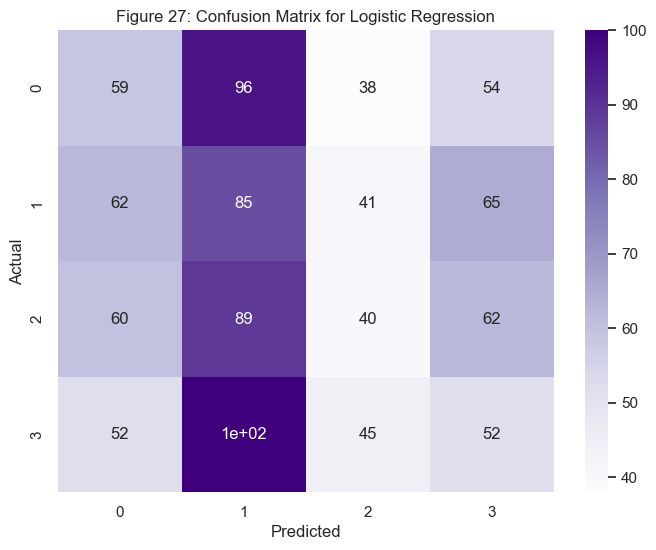

In [148]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy for Logistic Regression: {accuracy}")

cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix for Logistic Regression:\n{cm}")

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Purples')
plt.title("Figure 27: Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

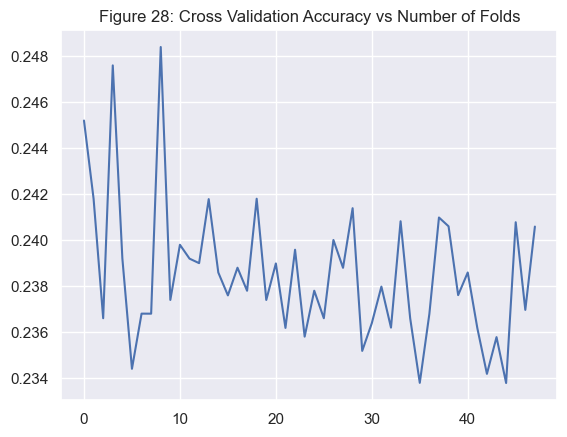

In [149]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())

plt.title('Figure 28: Cross Validation Accuracy vs Number of Folds')
plt.plot(list)

In [150]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 0.23


In [151]:
# Running 10-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(LOG, X , y, cv=10, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.23949238 0.25510666 0.26509302 0.26343616 0.21591045 0.23977265
 0.22037248 0.22598356 0.25358958 0.27975009]

Final Average Accuracy of the model: 0.25


#### Splitting into set 30%

In [152]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [153]:
clf = LogisticRegression(C=1,penalty='l2', solver='newton-cg')

print(clf)

LogisticRegression(C=1, solver='newton-cg')


In [154]:
LOG = clf.fit(X_train,y_train)
prediction = LOG.predict(X_test)

In [155]:
from sklearn import metrics

print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.28      0.21      0.24       380
         1.0       0.24      0.29      0.26       383
         2.0       0.24      0.21      0.22       361
         3.0       0.23      0.26      0.24       376

    accuracy                           0.24      1500
   macro avg       0.25      0.24      0.24      1500
weighted avg       0.25      0.24      0.24      1500



### Confusion Matrix

In [156]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[ 81 121  68 110]
 [ 71 112  84 116]
 [ 68 111  75 107]
 [ 73 123  83  97]]


In [157]:
LOG.classes_

array([0., 1., 2., 3.])

In [158]:
mapping = {0:'Disease_A', 1:'Disease_B', 2:'Disease_C', 3:'Disease_Unknown'}
classesMapped = [mapping.get(value, value) for value in clf.classes_]
classesMapped

['Disease_A', 'Disease_B', 'Disease_C', 'Disease_Unknown']

Accuracy for Logistic Regression: 0.24333333333333335
Confusion Matrix for Logistic Regression:
[[ 81 121  68 110]
 [ 71 112  84 116]
 [ 68 111  75 107]
 [ 73 123  83  97]]


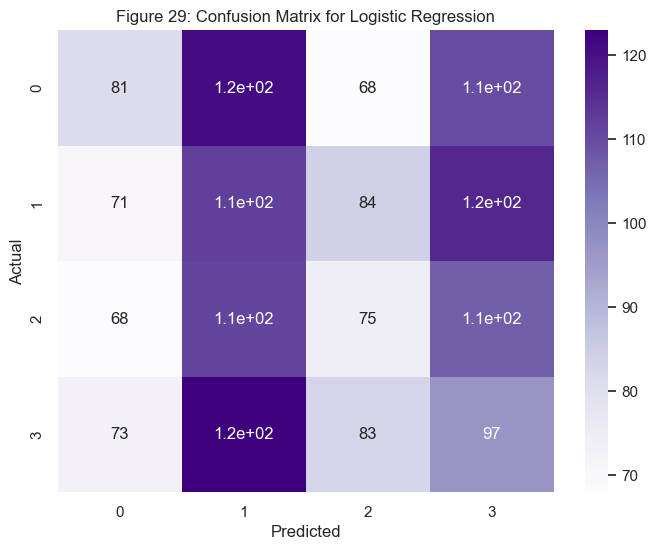

In [159]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy for Logistic Regression: {accuracy}")

cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix for Logistic Regression:\n{cm}")

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Purples')
plt.title("Figure 29: Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

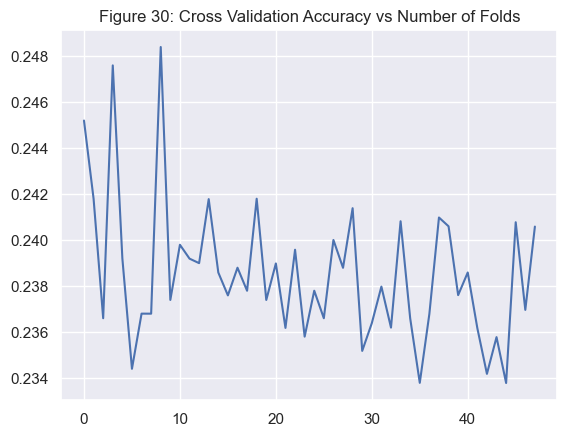

In [160]:
list = []
for i in range(2,50):
    list.append(cross_val_score(nvclassifier, X, y, scoring = 'accuracy', cv = i).mean())

plt.title('Figure 30: Cross Validation Accuracy vs Number of Folds')
plt.plot(list)

In [161]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 0.24


In [162]:
# Running 10-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(LOG, X , y, cv=10, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.23949238 0.25510666 0.26509302 0.26343616 0.21591045 0.23977265
 0.22037248 0.22598356 0.25358958 0.27975009]

Final Average Accuracy of the model: 0.25


### Random Forest

#### Splitting into set 10%

In [163]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10, random_state = 0)

In [164]:
X.shape, y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5000, 6), (5000,), (4500, 6), (500, 6), (4500,), (500,))

In [165]:
from sklearn.ensemble import RandomForestClassifier

clf_RF = RandomForestClassifier(n_estimators = 1000)

clf_RF.fit(X_train, y_train)

y_pred = clf_RF.predict(X_test)

In [166]:
from sklearn import metrics

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.248
Accuracy: 0.25


In [167]:
X = healthcare_data.drop('Disease_Encoded',axis=1)

y = healthcare_data['Disease_Encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

### Confusion Matrix

Accuracy for Logistic Regression: 0.248
Confusion Matrix for Logistic Regression:
[[ 98 115  38 131]
 [ 88  95  49 133]
 [100 110  53 120]
 [ 96 105  43 126]]


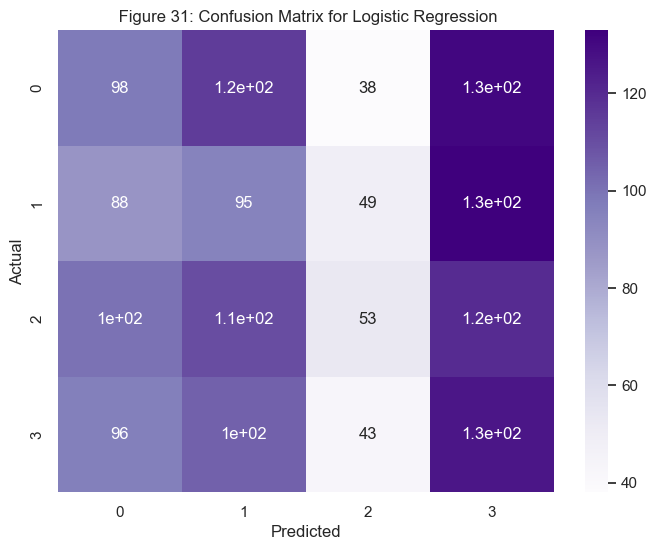

Accuracy for Random Forest: 0.264
Confusion Matrix for Random Forest:
[[103  93  90  96]
 [ 91 115  74  85]
 [ 92 111  92  88]
 [ 86 106  92  86]]


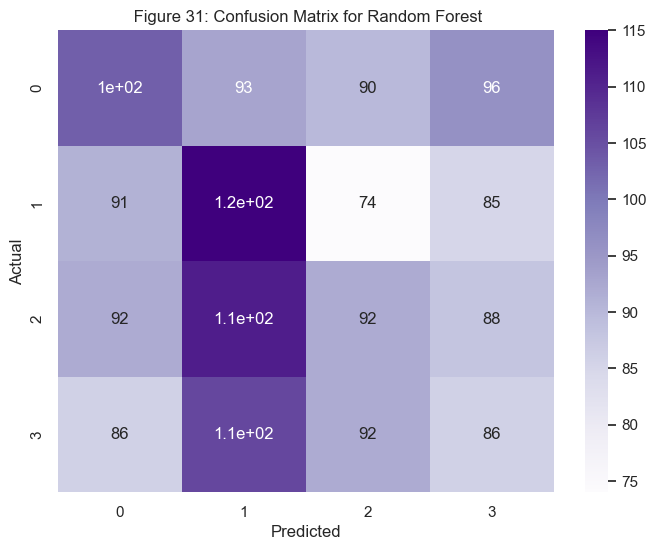

Accuracy for Support Vector Machine: 0.256
Confusion Matrix for Support Vector Machine:
[[  8 179  83 112]
 [  6 176  93  90]
 [  4 189  89 101]
 [  5 174  80 111]]


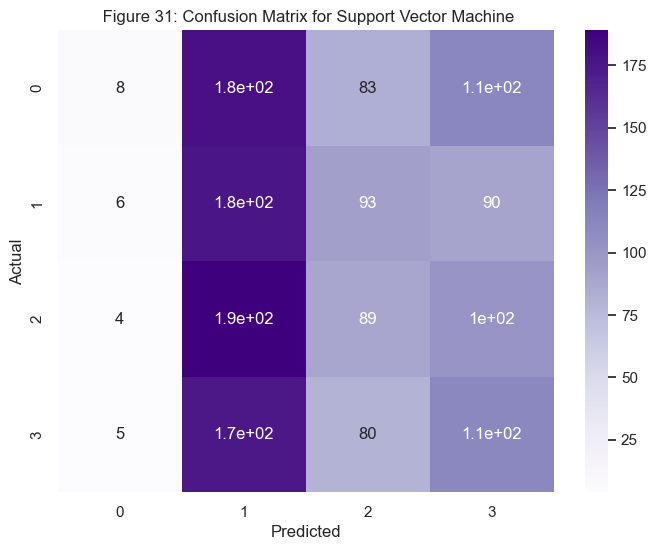

In [168]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Support Vector Machine": SVC()
}

for name, model in models.items():
    
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy for {name}: {accuracy}")
    
    cm = confusion_matrix(y_test, y_pred)
    print(f"Confusion Matrix for {name}:\n{cm}")
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap='Purples')
    plt.title(f" Figure 31: Confusion Matrix for {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

#### Default Hyperparameters

In [169]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

In [170]:
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [171]:
predictions = rfc.predict(X_test)

In [172]:
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [173]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.27      0.29      0.28       382
           1       0.25      0.28      0.26       365
           2       0.27      0.21      0.24       383
           3       0.26      0.26      0.26       370

    accuracy                           0.26      1500
   macro avg       0.26      0.26      0.26      1500
weighted avg       0.26      0.26      0.26      1500



### Confusion Matrix

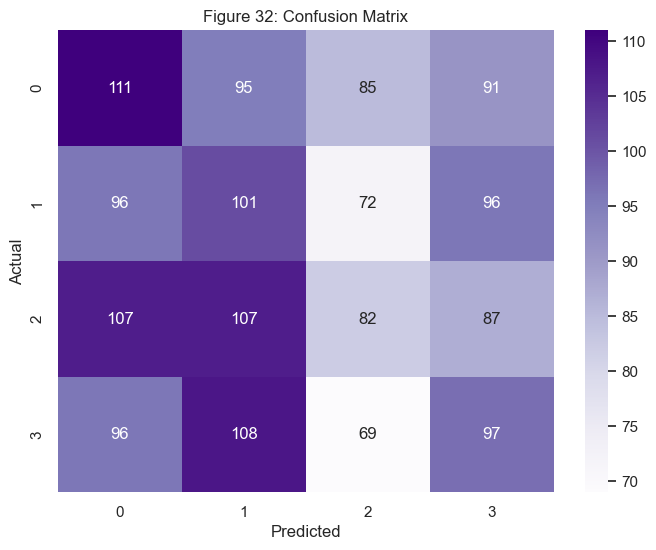

In [174]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

conf_matrix = confusion_matrix(y_test, predictions)

custom_palette = sns.color_palette("Purples", as_cmap=True)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap=custom_palette, fmt='g')
plt.title('Figure 32: Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [175]:
print(accuracy_score(y_test,predictions))

0.26066666666666666


### Hyperparameter Tuning

#### Tuning max_depth

In [176]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

n_folds = 5

parameters = {'max_depth': range(2, 20, 5)}   

rf = RandomForestClassifier()


rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': range(2, 20, 5)}, scoring='accuracy')

In [177]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.230450,0.012220,0.012640,0.007043,2,{'max_depth': 2},0.280000,0.265714,0.270000,0.271429,0.267143,0.270857,0.004998,1
1,0.341408,0.021018,0.017784,0.005940,7,{'max_depth': 7},0.262857,0.245714,0.235714,0.265714,0.267143,0.255429,0.012500,3
2,0.555284,0.059122,0.021317,0.008685,12,{'max_depth': 12},0.285714,0.247143,0.251429,0.260000,0.234286,0.255714,0.017143,2
3,0.649268,0.049738,0.028116,0.009105,17,{'max_depth': 17},0.247143,0.242857,0.250000,0.228571,0.228571,0.239429,0.009152,4


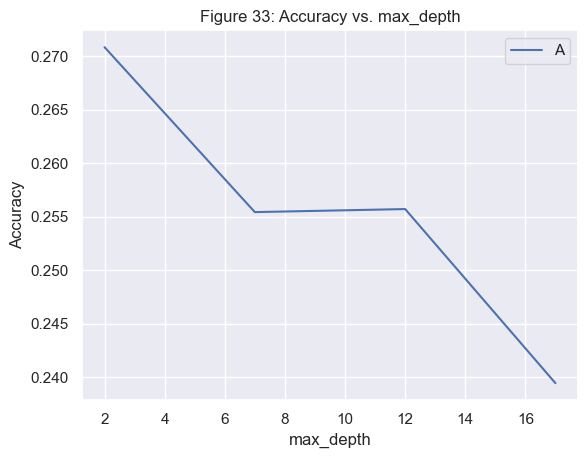

In [178]:
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend('Accuracy')

plt.title("Figure 33: Accuracy vs. max_depth")

plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [179]:
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),   # based on the records, on this case it has 3000
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]     #number of columns
}

rf = RandomForestClassifier()

grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [180]:
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             verbose=1)

In [181]:
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.25971334825678327 using {'max_depth': 4, 'max_features': 5, 'min_samples_leaf': 100, 'min_samples_split': 400, 'n_estimators': 200}


In [182]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=100)

In [183]:
rfc.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=100,
                       min_samples_split=200)

In [184]:
predictions = rfc.predict(X_test)

In [185]:
from sklearn.metrics import classification_report,confusion_matrix

In [186]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.27      0.19      0.23       382
           1       0.22      0.27      0.24       365
           2       0.26      0.20      0.23       383
           3       0.28      0.38      0.32       370

    accuracy                           0.26      1500
   macro avg       0.26      0.26      0.25      1500
weighted avg       0.26      0.26      0.25      1500



### Confusion Matrix

In [187]:
print(confusion_matrix(y_test,predictions))

[[ 74 109  72 127]
 [ 68  98  81 118]
 [ 70 122  76 115]
 [ 58 111  62 139]]


#### Splitting into set 20%

In [188]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [189]:
X.shape, y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5000, 14), (5000,), (4000, 14), (1000, 14), (4000,), (1000,))

In [190]:
from sklearn.ensemble import RandomForestClassifier

clf_RF = RandomForestClassifier(n_estimators = 1000)

clf_RF.fit(X_train, y_train)

y_pred = clf_RF.predict(X_test)

In [191]:
from sklearn import metrics

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.251
Accuracy: 0.25


#### Splitting into set 30%

In [192]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [193]:
X.shape, y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5000, 14), (5000,), (3500, 14), (1500, 14), (3500,), (1500,))

In [194]:
from sklearn.ensemble import RandomForestClassifier

clf_RF = RandomForestClassifier(n_estimators = 1000)

clf_RF.fit(X_train, y_train)

y_pred = clf_RF.predict(X_test)

In [195]:
from sklearn import metrics

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.25066666666666665
Accuracy: 0.25


### Min Max Scaler

In [196]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
import seaborn as sns

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# KNN

In [197]:
from sklearn.neighbors import KNeighborsClassifier

kNN = KNeighborsClassifier(n_neighbors = 4)

kNN.fit(X_train, y_train)

y_pred = kNN.predict(X_test)

In [198]:
from sklearn import metrics

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.24


### Confusion Matrix

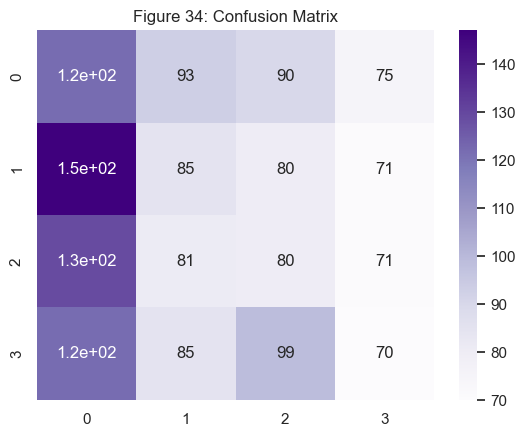

In [199]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_predict = kNN.predict(X_test)

cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm, annot=True, cmap='Purples')

plt.title('Figure 34: Confusion Matrix')

plt.show()

In [200]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.23      0.32      0.27       380
           1       0.25      0.22      0.23       383
           2       0.23      0.22      0.23       361
           3       0.24      0.19      0.21       376

    accuracy                           0.24      1500
   macro avg       0.24      0.24      0.24      1500
weighted avg       0.24      0.24      0.24      1500



# Decision Tree

In [201]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [202]:
healthcare_data.columns

Index(['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin',
       'HeartRate', 'Smoker', 'PhysicalActivity', 'SleepTime',
       'MedicalHistoryScore', 'IncomeLevel', 'StressLevel', 'HealthIns',
       'Disease_Encoded'],
      dtype='object')

In [203]:
feature_cols = ['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Smoker', 'Glucose', 'Insulin',
       'HeartRate', 'PhysicalActivity', 'SleepTime',
       'MedicalHistoryScore', 'IncomeLevel', 'StressLevel', 'HealthIns']
X = healthcare_data[feature_cols]
y = healthcare_data.Disease_Encoded

In [204]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

clf = DecisionTreeClassifier(criterion='gini', max_depth = 4, random_state = 0)

clf = clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

In [205]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.24
Accuracy: 0.24


In [206]:
X.columns.tolist()

['Age',
 'BMI',
 'BloodPressure',
 'Cholesterol',
 'Smoker',
 'Glucose',
 'Insulin',
 'HeartRate',
 'PhysicalActivity',
 'SleepTime',
 'MedicalHistoryScore',
 'IncomeLevel',
 'StressLevel',
 'HealthIns']

In [207]:
healthcare_data['Disease_Encoded'].unique().tolist()

[1, 0, 2, 3]

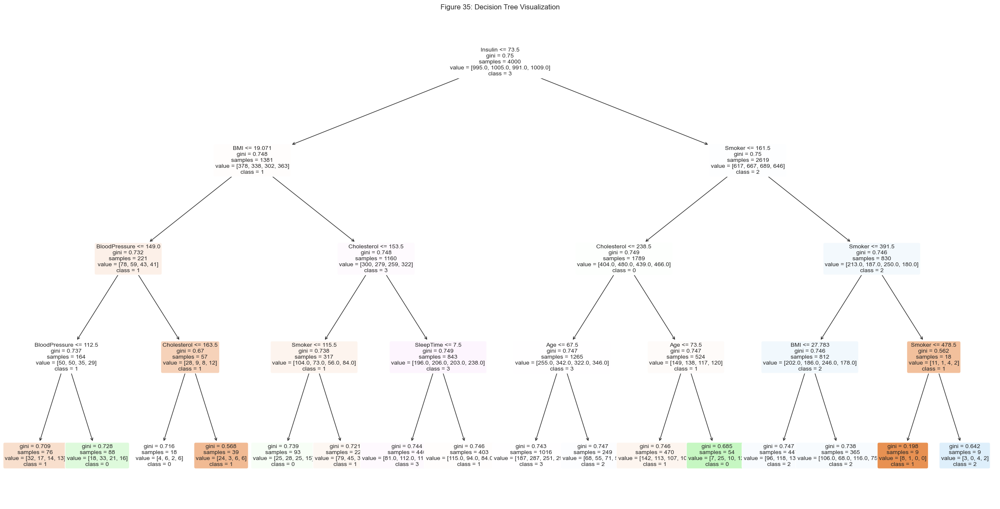

In [208]:
plt.figure(figsize=(30, 15))
plot_tree(clf, filled=True, feature_names=X.columns.tolist(), class_names=[str(label) for label in healthcare_data['Disease_Encoded'].unique()], rounded=True, fontsize=10)
plt.title('Figure 35: Decision Tree Visualization')
plt.show()

### Confusion Matrix

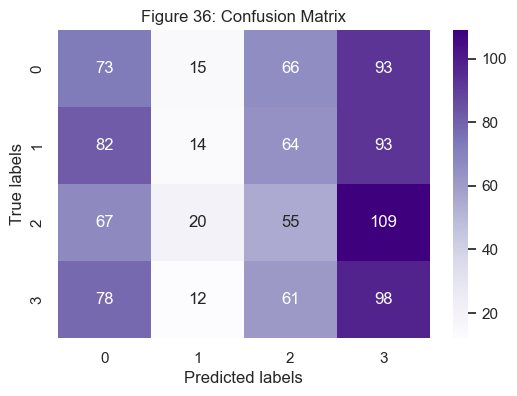

Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.30      0.27       247
           1       0.23      0.06      0.09       253
           2       0.22      0.22      0.22       251
           3       0.25      0.39      0.31       249

    accuracy                           0.24      1000
   macro avg       0.24      0.24      0.22      1000
weighted avg       0.24      0.24      0.22      1000



In [209]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

y_predict = clf.predict(X_test)

cm = confusion_matrix(y_test, y_predict)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Figure 36: Confusion Matrix')
plt.show()

report = classification_report(y_test, y_predict)
print("Classification Report:")
print(report)

In [210]:
from sklearn.tree import DecisionTreeClassifier

DTree = DecisionTreeClassifier()

DTree.fit(X_train, y_train)

y_pred = DTree.predict(X_test)

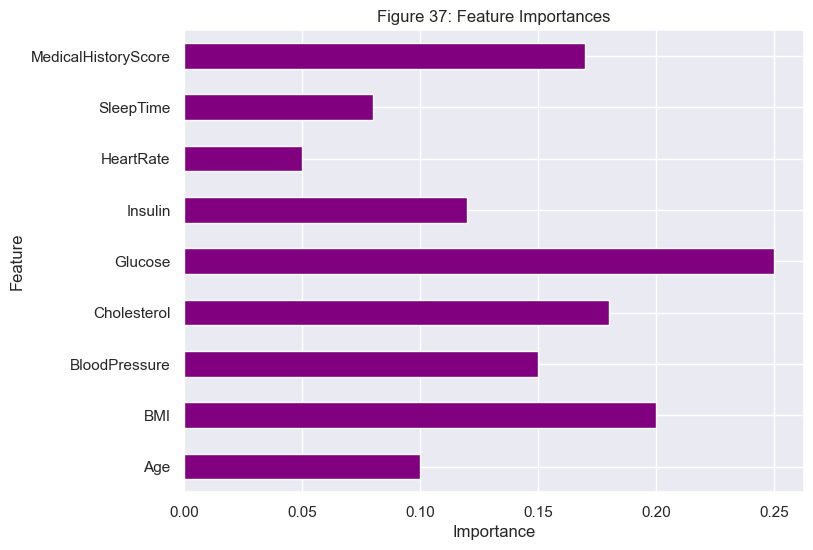

In [211]:
import pandas as pd
import matplotlib.pyplot as plt

index = ['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'SleepTime', 'MedicalHistoryScore']

values = [0.1, 0.2, 0.15, 0.18, 0.25, 0.12, 0.05, 0.08, 0.17]

feature_importances = pd.Series(values, index=index)

plt.figure(figsize=(8, 6))
feature_importances.plot(kind='barh', title='Figure 37: Feature Importances', grid=True, color='purple')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [212]:
# Running 10-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(DTree, X , y, cv=10, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.23388853 0.23320013 0.26848433 0.22111439 0.25305647 0.22361056
 0.24640286 0.26551924 0.26410989 0.25964551]

Final Average Accuracy of the model: 0.25


### SVC

In [213]:
healthcare_data.shape

(5000, 15)

In [214]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [215]:
from sklearn.svm import SVC
svc_model = SVC()
svc_model.fit(X_train, y_train)

SVC()

In [216]:
y_pred = svc_model.predict(X_test)

In [217]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.25533333333333336


### Model Evaluation

### Confusion Matrix

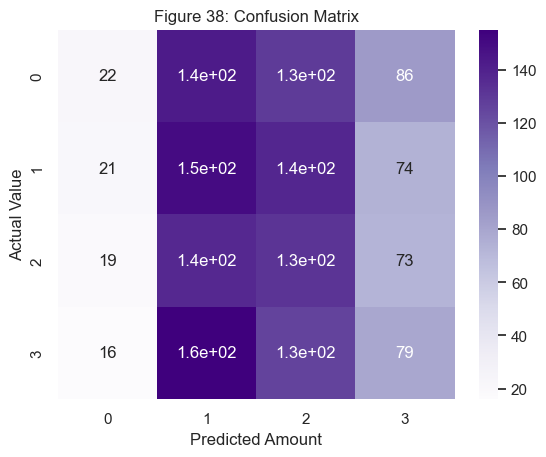

              precision    recall  f1-score   support

           0       0.28      0.06      0.10       380
           1       0.26      0.39      0.31       383
           2       0.25      0.37      0.30       361
           3       0.25      0.21      0.23       376

    accuracy                           0.26      1500
   macro avg       0.26      0.26      0.23      1500
weighted avg       0.26      0.26      0.23      1500



In [218]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_predict = svc_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot=True, cmap='Purples')

plt.title('Figure 38: Confusion Matrix')
plt.xlabel('Predicted Amount')
plt.ylabel('Actual Value')
plt.show()

print(classification_report(y_test, y_predict))

In [219]:
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

[[ 91  99  95  95]
 [ 97  95  97  94]
 [ 85 103  88  85]
 [ 81 102  92 101]]


Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.250 total time=   0.9s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.233 total time=   1.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.267 total time=   0.9s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.266 total time=   0.8s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.271 total time=   0.9s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.266 total time=   1.1s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.240 total time=   1.4s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.244 total time=   1.1s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.273 total time=   0.9s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.264 total time=   0.9s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.251 total time=   1.5s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.243 total time=   2.0s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.253 total time=   1.7s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.274 total time=   1.5s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.273 total time=   1.5s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.253 total time=   6.9s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.269 total time=   6.2s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.257 total time=   6.1s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.293 total time=   5.8s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.237 total time=   6.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.280 total time=   1.2s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.259 total time=   1.4s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.279 total time=   1.1s
[CV 4/5] END ....C=1000, gam

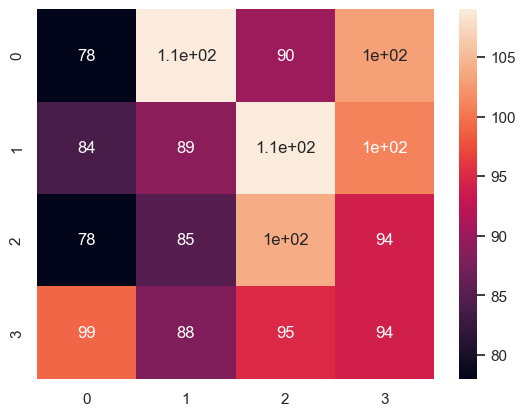

In [220]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['rbf']}

svc = SVC()

grid_search = GridSearchCV(svc, param_grid, verbose=4)
grid_search.fit(X_train_scaled, y_train)

print("Best hyperparameters found:")
print(grid_search.best_params_)

grid_predictions = grid_search.predict(X_test_scaled)

cm = confusion_matrix(y_test, grid_predictions)

sns.heatmap(cm, annot=True)

print("Figure 21: Classification Report:")
print(classification_report(y_test, grid_predictions))

In [221]:
# SMOTE: Synthetic Minority Oversampling Technique (SMOTE) is a statistical technique for increasing the number of cases in your dataset in a balanced way. The component works by generating new instances from existing minority cases that you supply as input.
from collections import Counter
from imblearn.over_sampling import SMOTE 

print('Original dataset shape %s' % Counter(y))

sm = SMOTE(random_state = 42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({1: 1258, 3: 1258, 0: 1242, 2: 1242})
Resampled dataset shape Counter({1: 1258, 0: 1258, 2: 1258, 3: 1258})


In [222]:
# find best hyper parameters
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Artificial Neural Networks

In [223]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [224]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((3500, 14), (1500, 14), (3500,), (1500,))

In [225]:
import numpy as np
import random
import tensorflow
tensorflow.random.set_seed(16)
np.random.seed(1)
random.seed(1)

In [226]:
from keras.models import Sequential
model = Sequential()

In [227]:
from keras.layers import Dense

model.add(Dense(32, activation = 'relu', input_dim = 14))

In [228]:
model.add(Dense(16, activation = 'relu'))

In [229]:
model.add(Dense(1, activation = 'sigmoid'))

In [230]:
model.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [231]:
model.fit(X_train, y_train, epochs = 200)  

Epoch 1/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2538 - loss: 0.0000e+00
Epoch 2/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 3/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 4/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 5/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 6/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 7/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 8/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 9/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 10/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 11/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 67/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 68/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 69/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 70/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 71/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 72/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 73/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 74/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 75/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 76/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
E

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 195/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 196/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 197/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 198/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 199/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2633 - loss: 0.0000e+00
Epoch 200/200
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 0.0000e+00


In [232]:
scores = model.evaluate(X_train, y_train)
print("Training Accuracy: %.2f%%\n" % (scores[1]*100))

scores = model.evaluate(X_test, y_test)
print("Testing Accuracy: %.2f%%\n" % (scores[1]*100))

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2554 - loss: 0.0000e+00
Training Accuracy: 25.03%

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2550 - loss: 0.0000e+00
Testing Accuracy: 25.47%



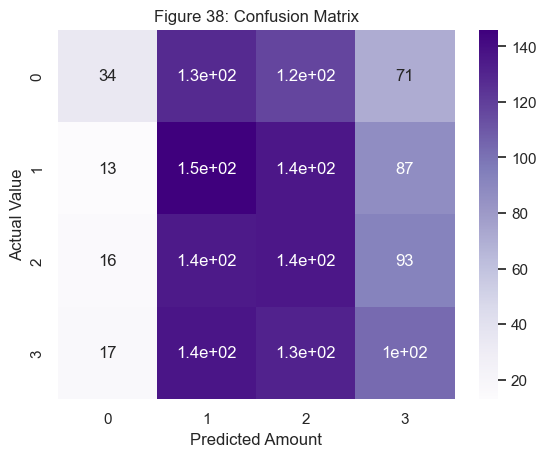

              precision    recall  f1-score   support

           0       0.42      0.10      0.16       350
           1       0.27      0.38      0.31       382
           2       0.26      0.36      0.30       380
           3       0.29      0.27      0.28       388

    accuracy                           0.28      1500
   macro avg       0.31      0.28      0.26      1500
weighted avg       0.31      0.28      0.27      1500



In [233]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_predict = svc_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot=True, cmap='Purples')

plt.title('Figure 38: Confusion Matrix')
plt.xlabel('Predicted Amount')
plt.ylabel('Actual Value')
plt.show()

print(classification_report(y_test, y_predict))

### Unsuperviser Learning

### K-means Clustering:

In [234]:
from sklearn.cluster import KMeans

In [235]:
X = healthcare_data.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]].values
y = healthcare_data.iloc[:, 14].values

In [236]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [237]:
columns_to_cluster = [
                 'Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 
                 'HeartRate', 'Smoker', 'PhysicalActivity', 'SleepTime', 'MedicalHistoryScore',
                 'IncomeLevel', 'StressLevel', 'HealthIns'
]
subset = healthcare_data[columns_to_cluster]

In [238]:
scaler = StandardScaler()

subset_scaled = scaler.fit_transform(subset)

kmeans = KMeans(n_clusters=5, max_iter=50, random_state=42)
kmeans.fit(subset_scaled)

labels = kmeans.labels_

In [239]:
healthcare_data['Cluster'] = kmeans.labels_
print(healthcare_data.head())

   Age        BMI  BloodPressure  Cholesterol  Glucose  Insulin  HeartRate  \
0   56  27.577099           88.0        108.0       92      171         75   
1   69  26.233744           88.0        252.0      102      179         71   
2   46  29.646620          152.0        141.0       89      198         90   
3   32  30.619597          106.0        273.0      159      222         64   
4   60  16.794395           96.0        172.0      173       30         99   

   Smoker  PhysicalActivity  SleepTime  MedicalHistoryScore  IncomeLevel  \
0       0                 1          9                    5            2   
1       0                 2          9                    3            2   
2       1                 0          5                    5            1   
3       1                 1          7                    0            1   
4       1                 0          7                    3            2   

   StressLevel  HealthIns  Disease_Encoded  Cluster  
0            0      

In [240]:
cluster_summary = healthcare_data.groupby('Cluster').mean()
print(cluster_summary)

               Age        BMI  BloodPressure  Cholesterol     Glucose  \
Cluster                                                                 
0        55.869806  29.147764     129.622303   212.625016  130.742382   
1        50.772773  27.837731     120.608563   158.266602  136.103103   
2        47.489382  27.076641     138.924413   251.712411  160.487452   
3        45.540936  26.329739     128.956096   185.577217  130.886940   
4        43.078271  25.959967     130.422555   185.161542  127.438084   

            Insulin  HeartRate    Smoker  PhysicalActivity  SleepTime  \
Cluster                                                                 
0        134.241921  77.876270  0.090489          0.867036   7.937211   
1        117.684685  78.402402  0.916917          1.047047   6.174174   
2        135.003861  79.003861  0.721042          0.871622   7.227799   
3        140.896686  87.446394  0.053606          1.150097   7.228070   
4        216.695093  78.829439  0.859813          

In [241]:
kmeans = KMeans(n_clusters=5, max_iter=50, random_state=42)
kmeans.fit(subset_scaled)

KMeans(max_iter=50, n_clusters=5, random_state=42)

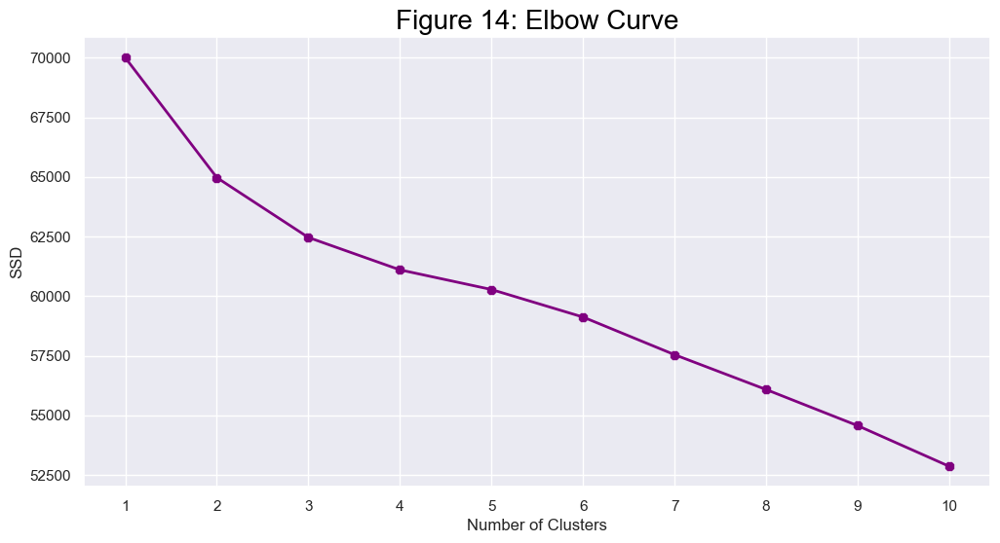

In [242]:
ssd = []
for num_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50, random_state=42)
    kmeans.fit(subset_scaled)
    ssd.append(kmeans.inertia_)

plt.figure(figsize=(12, 6))
plt.plot(range(1, 11), ssd, linewidth=2, color="purple", marker="8")
plt.xlabel("Number of Clusters")
plt.xticks(np.arange(1, 11, 1))
plt.ylabel("SSD")
plt.title("Figure 14: Elbow Curve", fontsize=20, color="black")

plt.grid(True)

plt.show()

In [243]:
print(healthcare_data.head())

print("Inertia:", kmeans.inertia_)

print("Cluster Centers:", kmeans.cluster_centers_)

   Age        BMI  BloodPressure  Cholesterol  Glucose  Insulin  HeartRate  \
0   56  27.577099           88.0        108.0       92      171         75   
1   69  26.233744           88.0        252.0      102      179         71   
2   46  29.646620          152.0        141.0       89      198         90   
3   32  30.619597          106.0        273.0      159      222         64   
4   60  16.794395           96.0        172.0      173       30         99   

   Smoker  PhysicalActivity  SleepTime  MedicalHistoryScore  IncomeLevel  \
0       0                 1          9                    5            2   
1       0                 2          9                    3            2   
2       1                 0          5                    5            1   
3       1                 1          7                    0            1   
4       1                 0          7                    3            2   

   StressLevel  HealthIns  Disease_Encoded  Cluster  
0            0      

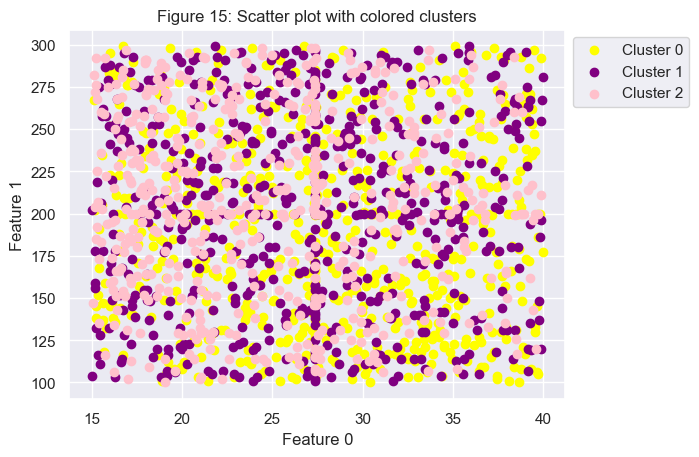

In [244]:
import matplotlib.pyplot as plt

X_varied = healthcare_data[['BMI', 'Cholesterol']].values

y_pred = kmeans.labels_

colors = ['yellow', 'purple', 'pink']

for cluster_id, color in zip(range(3), colors):
    plt.scatter(X_varied[y_pred == cluster_id, 0], X_varied[y_pred == cluster_id, 1], color=color)

plt.legend(["Cluster 0", "Cluster 1", "Cluster 2"], loc='upper left', bbox_to_anchor=(1, 1))
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.title("Figure 15: Scatter plot with colored clusters")
plt.show()

In [245]:
import plotly.express as px
import pandas as pd

healthcare_data['Cluster'] = kmeans.labels_

scatter_data = pd.DataFrame({
    'Age': healthcare_data['Age'],
    'BloodPressure': healthcare_data['BloodPressure'],
    'HeartRate': healthcare_data['HeartRate'],
    'Smoker': healthcare_data['Smoker'],
    'PhysicalActivity': healthcare_data['PhysicalActivity'],
    'SleepTime': healthcare_data['SleepTime'],
    'MedicalHistoryScore': healthcare_data['MedicalHistoryScore'],
    'StressLevel': healthcare_data['StressLevel'],
    'HealthIns': healthcare_data['HealthIns'],
    'Disease_Encoded': healthcare_data['Disease_Encoded'],
    'Cluster': healthcare_data['Cluster']
})

fig = px.scatter_3d(scatter_data, 
                    x='Age', 
                    y='BloodPressure', 
                    z='HeartRate', 
                    color='Cluster', 
                    color_continuous_scale='purples',  
                    title='Figure 16: 3D Cluster Scatter Plot')

fig.update_traces(marker=dict(size=5))

fig.update_layout(height=600, width=800)

fig.show()

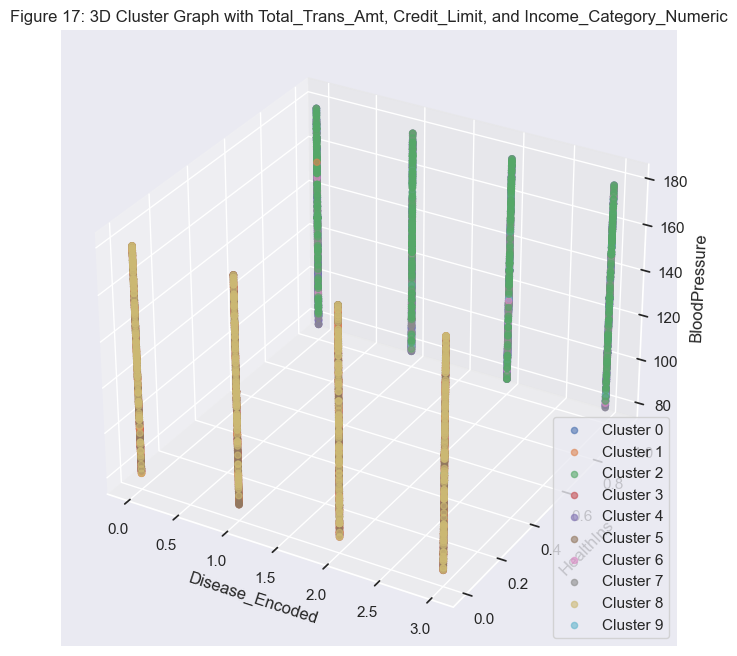

In [246]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

x = healthcare_data['Disease_Encoded']
y = healthcare_data['HealthIns']
z = healthcare_data['BloodPressure']

labels = kmeans.labels_

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(labels):
    indices = labels == label
    ax.scatter(x[indices], y[indices], z[indices], label=f'Cluster {label}', alpha=0.6)

ax.set_xlabel('Disease_Encoded')
ax.set_ylabel('HealthIns')
ax.set_zlabel('BloodPressure')

plt.legend()
plt.title('Figure 17: 3D Cluster Graph with Total_Trans_Amt, Credit_Limit, and Income_Category_Numeric')
plt.show()

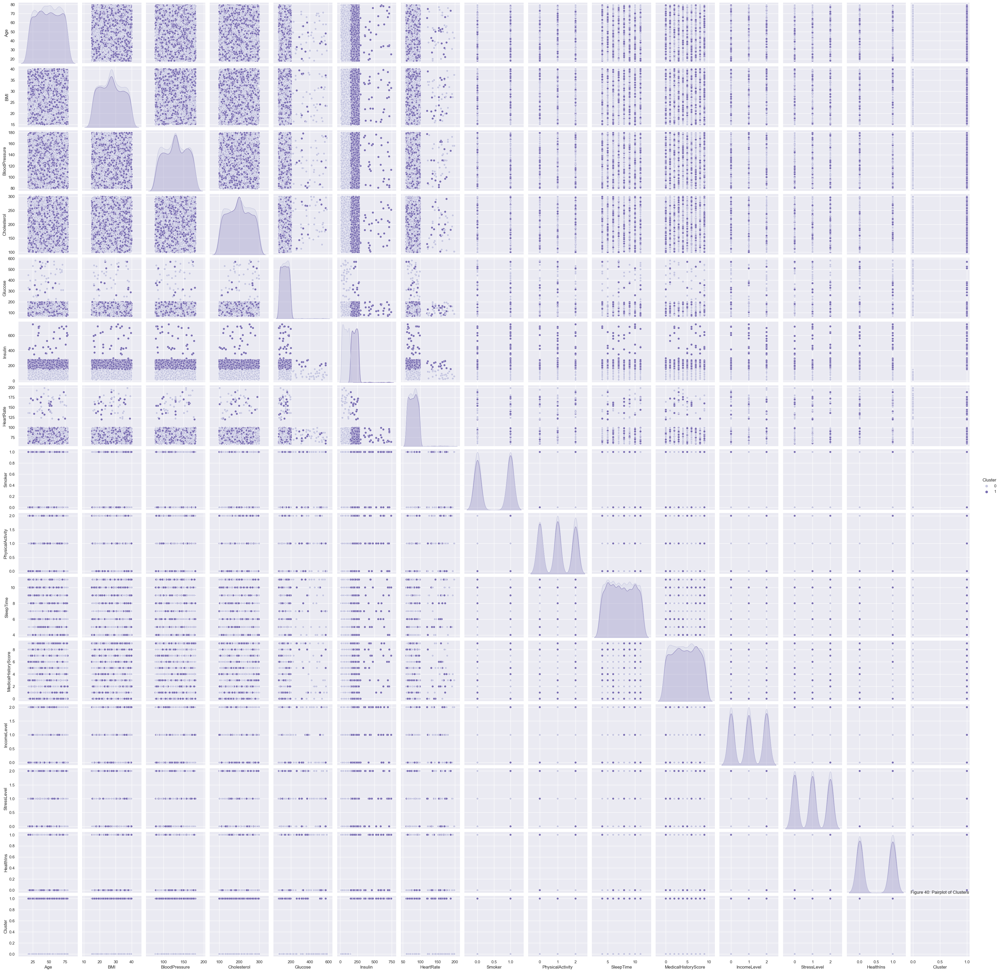

In [247]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

def unsupervised_learning(data, n_clusters=2, title=''):
    X = data.drop(columns=['Disease_Encoded'])

    kmeans = KMeans(n_clusters=n_clusters)

    kmeans.fit(X)

    data['Cluster'] = kmeans.labels_

    sns.pairplot(data, hue='Cluster', palette='Purples', vars=X.columns)
    plt.title('Figure 40: Pairplot of Clusters')  
    plt.show()

    return data

healthcare_data_clustered = unsupervised_learning(healthcare_data, title='Pairplot of Clusters')

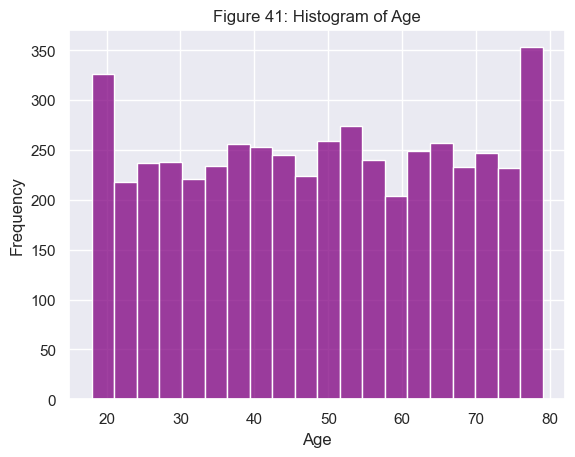

In [248]:
sns.histplot(healthcare_data['Age'], bins=20, color='Purple')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Figure 41: Histogram of Age')
plt.show()

[Text(0.5, 0, 'Disease'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Figure 42: Disease Histogram')]

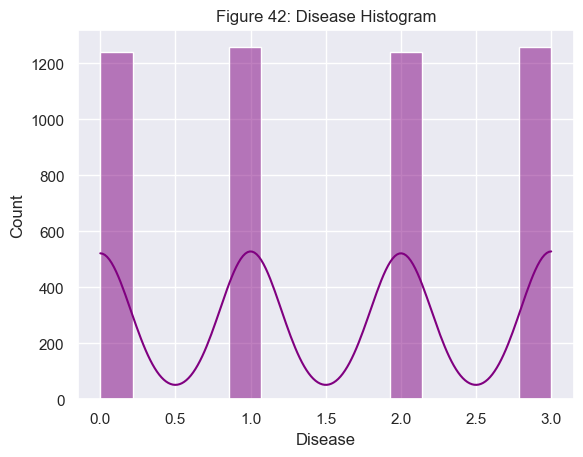

In [249]:
ax = sns.histplot(healthcare_data.Disease_Encoded, kde = True, color = 'Purple')
ax.set(xlabel = 'Disease', ylabel = 'Count', title = 'Figure 42: Disease Histogram')

Text(0.5, 1.0, 'Figure 43: SleepTime Distribution')

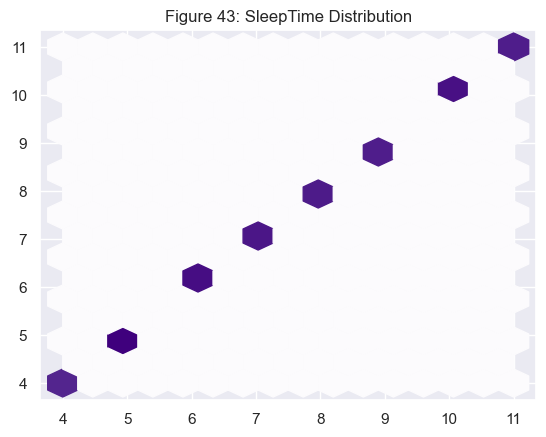

In [250]:
plt.hexbin(healthcare_data['SleepTime'], healthcare_data['SleepTime'], gridsize=15, cmap="Purples")
plt.title('Figure 43: SleepTime Distribution')

Text(0.5, 1.0, 'Figure 44: Cholesterol Distribution')

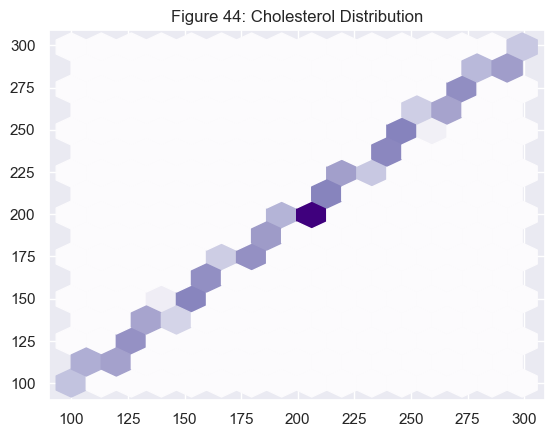

In [251]:
plt.hexbin(healthcare_data['Cholesterol'], healthcare_data['Cholesterol'], gridsize=15, cmap="Purples")
plt.title('Figure 44: Cholesterol Distribution')

Text(0.5, 1.0, 'Figure 45: Glucose Distribution')

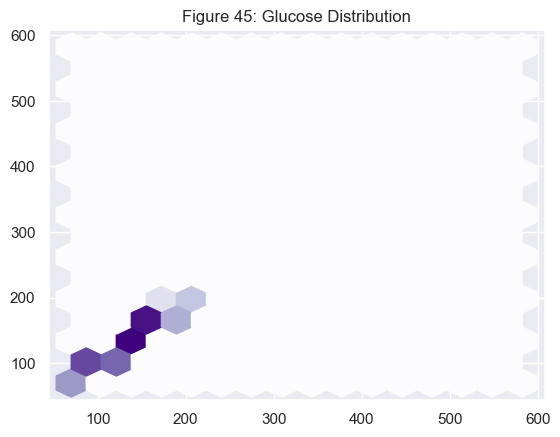

In [252]:
plt.hexbin(healthcare_data['Glucose'], healthcare_data['Glucose'], gridsize=15, cmap="Purples")
plt.title('Figure 45: Glucose Distribution')

Text(0.5, 1.0, 'Figure 46: Insulin Distribution')

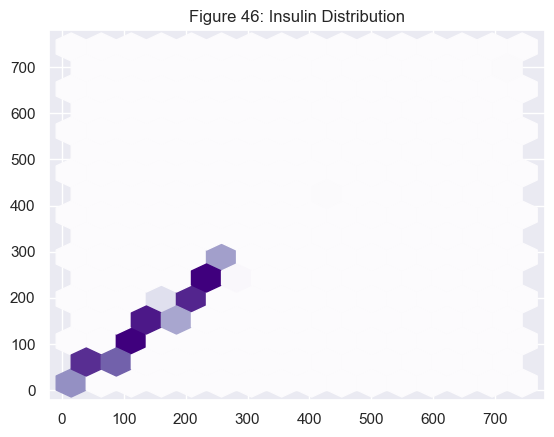

In [253]:
plt.hexbin(healthcare_data['Insulin'], healthcare_data['Insulin'], gridsize=15, cmap="Purples")
plt.title('Figure 46: Insulin Distribution')

Text(0.5, 1.0, 'Figure 47: HeartRate Distribution')

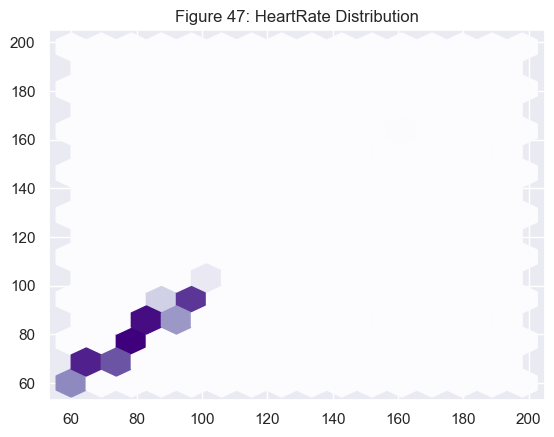

In [254]:
plt.hexbin(healthcare_data['HeartRate'], healthcare_data['HeartRate'], gridsize=15, cmap="Purples")
plt.title('Figure 47: HeartRate Distribution')

Text(0.5, 1.0, 'Figure 48: Age Distribution')

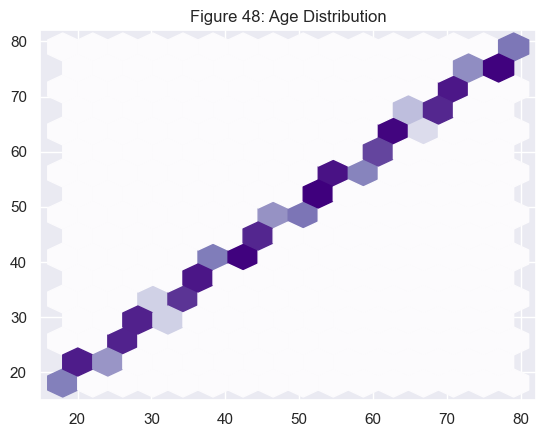

In [255]:
plt.hexbin(healthcare_data['Age'], healthcare_data['Age'], gridsize=15, cmap="Purples")
plt.title('Figure 48: Age Distribution')

Text(0.5, 1.0, 'Figure 49: BloodPressure Distribution')

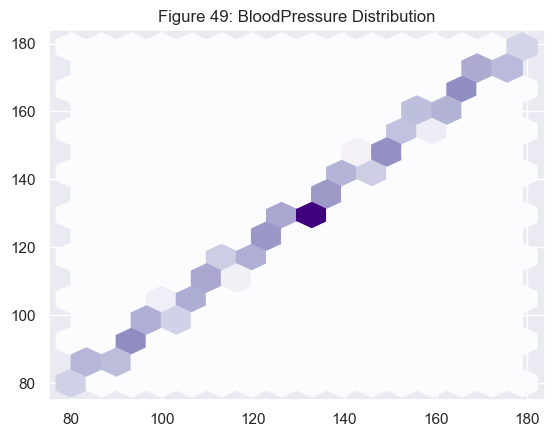

In [256]:
plt.hexbin(healthcare_data['BloodPressure'], healthcare_data['BloodPressure'], gridsize=15, cmap="Purples")
plt.title('Figure 49: BloodPressure Distribution')

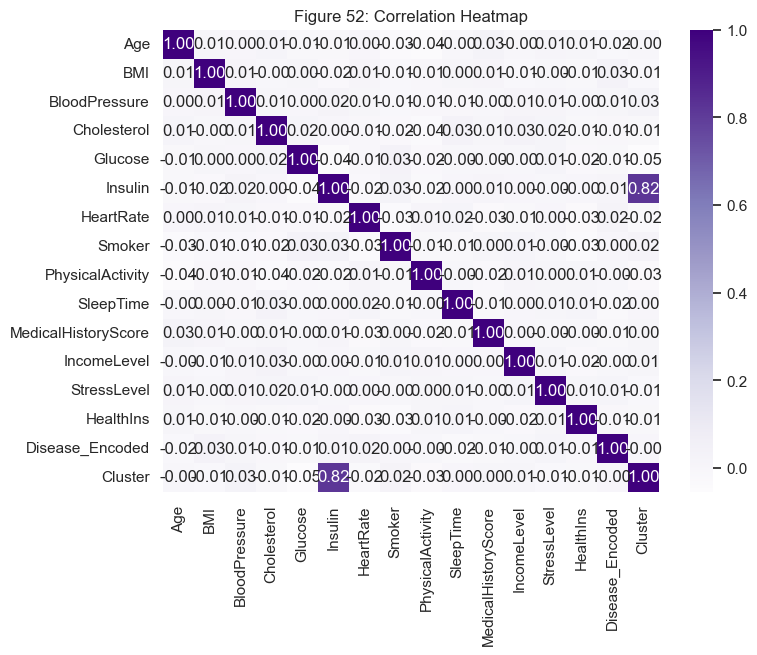

In [257]:
plt.figure(figsize=(8,6))
sns.heatmap(healthcare_data.corr(), annot=True, cmap='Purples', fmt='.2f')
plt.title('Figure 52: Correlation Heatmap')
plt.show()

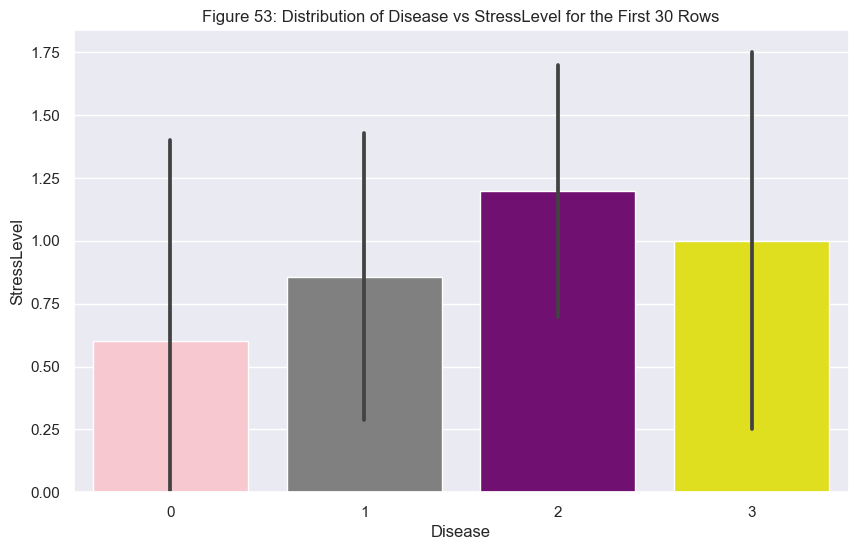

In [258]:
import matplotlib.pyplot as plt
import seaborn as sns

size_columns = healthcare_data.head(30)

plt.figure(figsize=(10, 6))
sns.barplot(x='Disease_Encoded', y='StressLevel', data=size_columns, palette=['pink', 'grey', 'Purple', 'yellow'])
plt.title('Figure 53: Distribution of Disease vs StressLevel for the First 30 Rows')
plt.xlabel('Disease')
plt.ylabel('StressLevel')
plt.show()

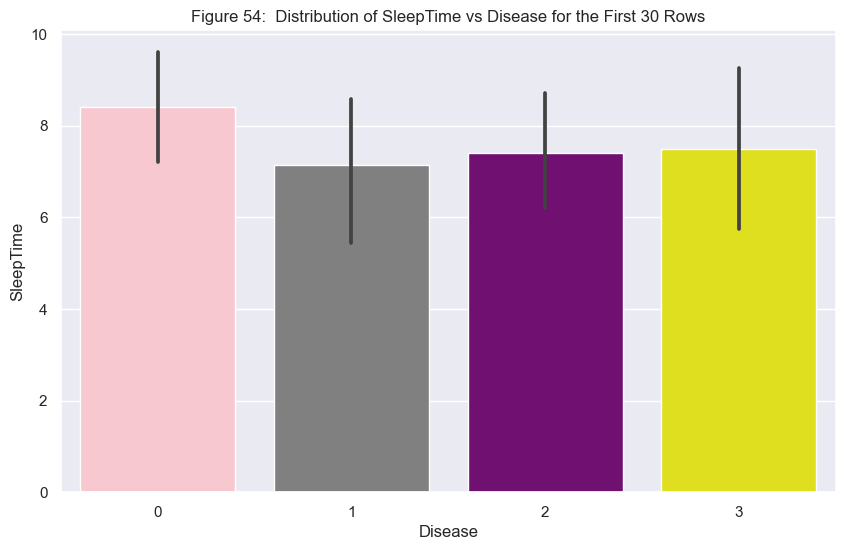

In [259]:
import matplotlib.pyplot as plt
import seaborn as sns

size_columns = healthcare_data.head(30)

plt.figure(figsize=(10, 6))
sns.barplot(x='Disease_Encoded', y='SleepTime', data=size_columns, palette=['pink', 'grey', 'Purple', 'yellow'])
plt.title('Figure 54:  Distribution of SleepTime vs Disease for the First 30 Rows')
plt.xlabel('Disease')
plt.ylabel('SleepTime')
plt.show()

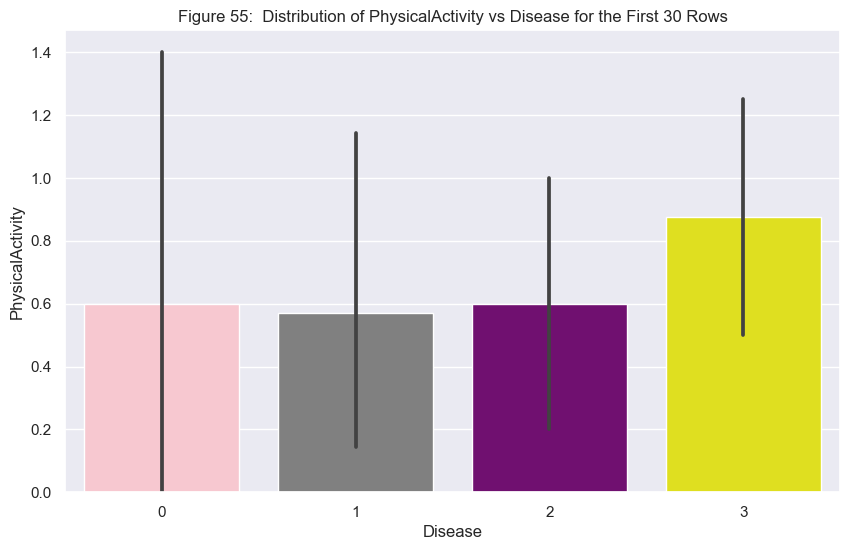

In [260]:
import matplotlib.pyplot as plt
import seaborn as sns

size_columns = healthcare_data.head(30)

plt.figure(figsize=(10, 6))
sns.barplot(x='Disease_Encoded', y='PhysicalActivity', data=size_columns, palette=['pink', 'grey', 'Purple', 'yellow'])
plt.title('Figure 55:  Distribution of PhysicalActivity vs Disease for the First 30 Rows')
plt.xlabel('Disease')
plt.ylabel('PhysicalActivity')
plt.show()

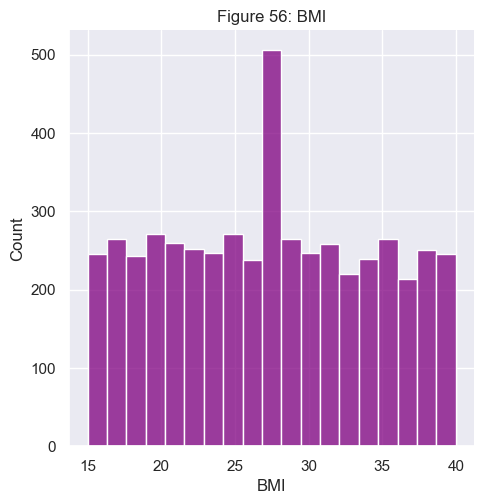

In [261]:
sns.displot(healthcare_data['BMI'], color='Purple')

plt.title('Figure 56: BMI')
plt.show()

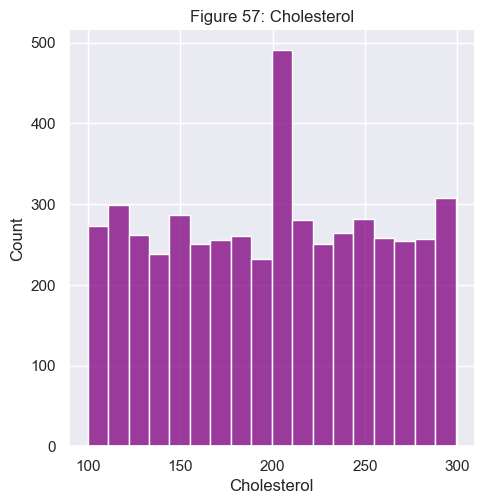

In [262]:
sns.displot(healthcare_data['Cholesterol'], color='Purple')

plt.title('Figure 57: Cholesterol')
plt.show()

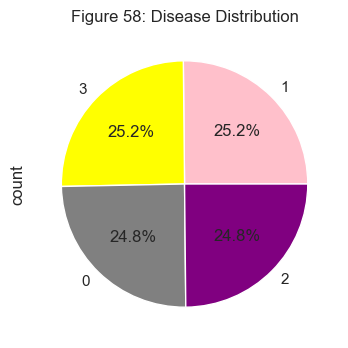

In [263]:
import matplotlib.pyplot as plt

sizes = healthcare_data['Disease_Encoded'].value_counts()

plt.figure(figsize=(4, 4))
sizes.plot(kind='pie', autopct='%1.1f%%',  colors=['pink', 'yellow', 'grey', 'Purple'])

plt.title('Figure 58: Disease Distribution')

plt.show()

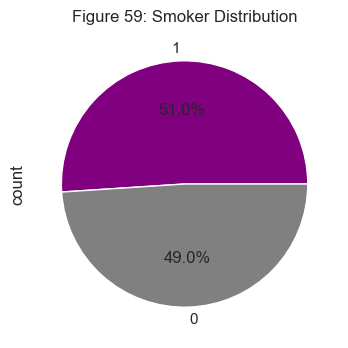

In [264]:
import matplotlib.pyplot as plt

sizes = healthcare_data['Smoker'].value_counts()

plt.figure(figsize=(4, 4))
sizes.plot(kind='pie', autopct='%1.1f%%', colors=['Purple', 'grey'])

plt.title('Figure 59: Smoker Distribution')

plt.show()

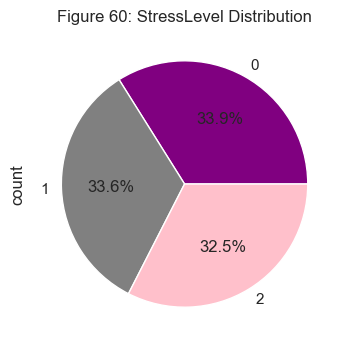

In [265]:
import matplotlib.pyplot as plt

sizes = healthcare_data['StressLevel'].value_counts()

plt.figure(figsize=(4, 4))
sizes.plot(kind='pie', autopct='%1.1f%%', colors=['Purple', 'grey', 'pink'])

plt.title('Figure 60: StressLevel Distribution')

plt.show()

### Comparison of ML modelling outcomes using a Table or graph visualisation. 

In [266]:
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

dtc = DecisionTreeClassifier()
ann = MLPClassifier()
svc = SVC()
log_reg = LogisticRegression()
rfc = RandomForestClassifier()

models = [svc, log_reg, rfc, dtc, ann]
model_names = ['SVC', 'Logistic Regression', 'Random Forest Classifier', 'Decision Tree', 'Artificial Neural Network']

metrics_dict = {'Model': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1-score': []}

for model, name in zip(models, model_names):
    # training
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    report = classification_report(y_test, predictions, output_dict=True)
    precision = report['weighted avg']['precision']
    recall = report['weighted avg']['recall']
    f1_score = report['weighted avg']['f1-score']

    metrics_dict['Model'].append(name)
    metrics_dict['Accuracy'].append(accuracy)
    metrics_dict['Precision'].append(precision)
    metrics_dict['Recall'].append(recall)
    metrics_dict['F1-score'].append(f1_score)

metrics_df = pd.DataFrame(metrics_dict)

print(metrics_df)

                       Model  Accuracy  Precision  Recall  F1-score
0                        SVC     0.256   0.255250   0.256  0.255156
1        Logistic Regression     0.238   0.239109   0.238  0.233980
2   Random Forest Classifier     0.244   0.244622   0.244  0.243780
3              Decision Tree     0.228   0.233123   0.228  0.229570
4  Artificial Neural Network     0.250   0.226147   0.250  0.203752


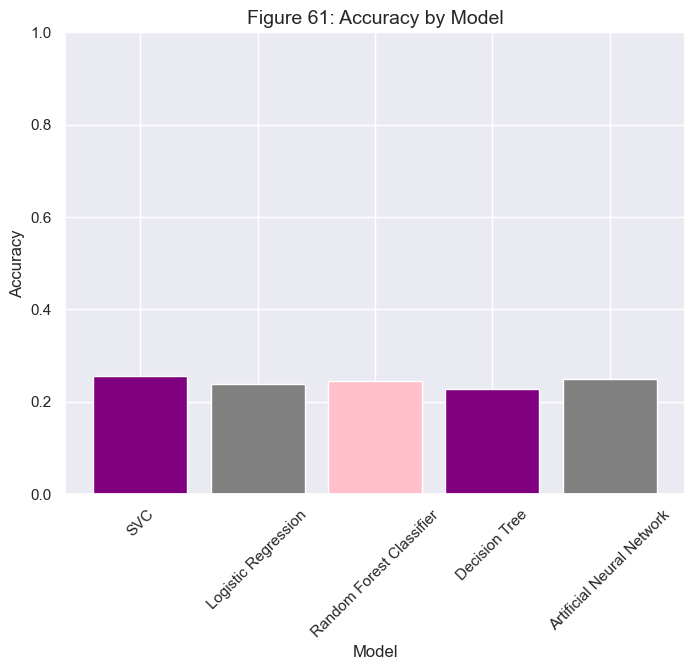

In [267]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.bar(metrics_df['Model'], metrics_df['Accuracy'], color=['Purple', 'grey', 'pink'])

plt.title('Figure 61: Accuracy by Model', size=14)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  
plt.xticks(rotation=45)

plt.show()

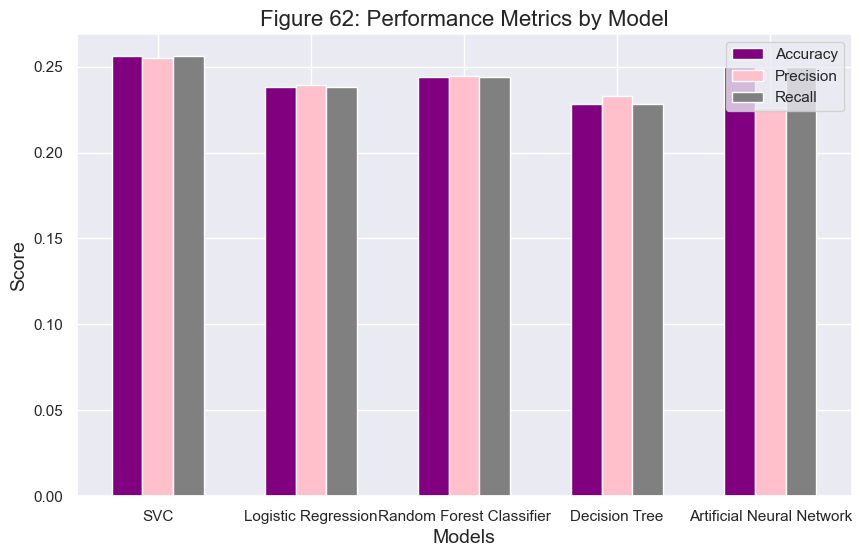

In [268]:
import matplotlib.pyplot as plt
import numpy as np

accuracy_values = metrics_df['Accuracy']
precision_values = metrics_df['Precision']
recall_values = metrics_df['Recall']

bar_width = 0.2

index = np.arange(len(metrics_df['Model']))

plt.figure(figsize=(10, 6))

plt.bar(index, accuracy_values, bar_width, label='Accuracy',  color='Purple')
plt.bar(index + bar_width, precision_values, bar_width, label='Precision',  color='pink')
plt.bar(index + 2*bar_width, recall_values, bar_width, label='Recall',  color='grey')

plt.title('Figure 62: Performance Metrics by Model', size=16)
plt.xlabel('Models', size=14)
plt.ylabel('Score', size=14)
plt.xticks(index + bar_width, metrics_df['Model'])
plt.legend()

plt.show()

## Statistical summary and short inferences:

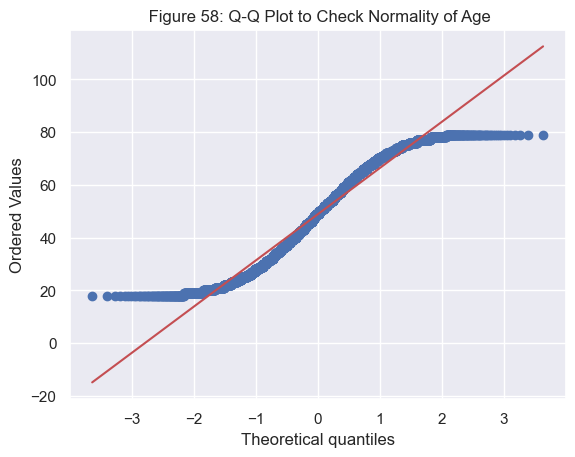

In [269]:
import scipy.stats as stats

def plot_qq(column):
    data = healthcare_data[column].dropna()
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f' Figure 58: Q-Q Plot to Check Normality of {column}')
    plt.show()

plot_qq('Age')

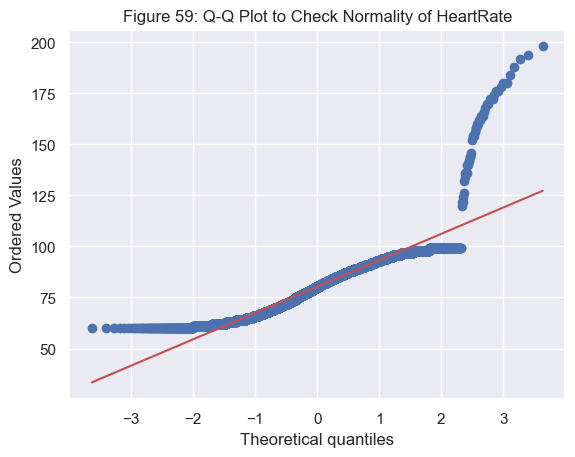

In [270]:
import scipy.stats as stats

def plot_qq(column):
    data = healthcare_data[column].dropna()
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f'Figure 59: Q-Q Plot to Check Normality of {column}')
    plt.show()

plot_qq('HeartRate')

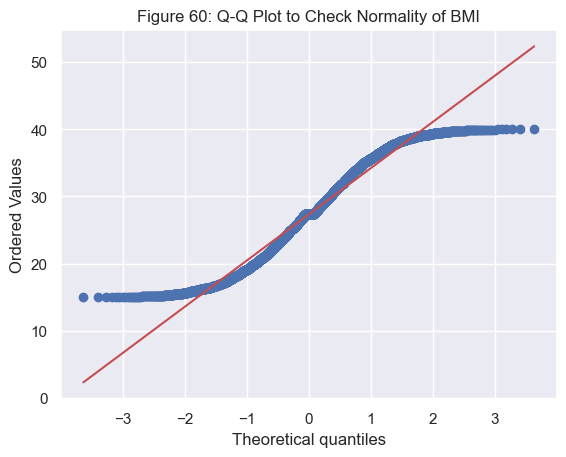

In [271]:
import scipy.stats as stats

def plot_qq(column):
    data = healthcare_data[column].dropna()
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f'Figure 60: Q-Q Plot to Check Normality of {column}')
    plt.show()

plot_qq('BMI')

### Why has been selected those variables?
#### I have choose categoricals variables because the continuous would be hard to understand a pattern of probability of who has a type of Disease and at the same time Health Insurance.

HealthIns 0 represents Yes and 1 No.
Disease A = 0
Disease B = 1
Disease C = 2
Disease D = 3

In [272]:
import statistics as stats
from scipy.stats import binom

In [273]:
cross_tab = pd.crosstab(index=healthcare_data['Smoker'], columns=healthcare_data['HealthIns'])

print(cross_tab)

HealthIns     0     1
Smoker               
0          1178  1270
1          1316  1236


### Who has the Insurance and Non Smoker?

In [274]:
(1270 / 2506)

0.5067837190742218

In [275]:
binom.cdf(k =50 , n = 100  , p = 0.5067) 

0.4862701088749214

### Calculating probability between 70 and 100 inclusive, it was substract from P(x=<100) - P(x=<29):

In [276]:
binom.cdf(k =70 , n = 100 , p = 0.5067) - binom.cdf(k =29 , n = 100 , p = 0.5067)

0.9999626157882583

### Calculate probability between 50 and 80 inclusive, it was substract from P(x=<80) - P(x=<49):

In [277]:
binom.cdf(k =80 , n = 100 , p = 0.5067) - binom.cdf(k =49 , n = 100 , p = 0.5067)

0.5926077104893344

### Probabilities Disease_Encoded and Smoker

In [278]:
cross_tab = pd.crosstab(index=healthcare_data['Disease_Encoded'], columns=healthcare_data['Smoker'])

print(cross_tab)

Smoker             0    1
Disease_Encoded          
0                594  648
1                631  627
2                627  615
3                596  662


### Who is Smoker and has the Disease 2?

In [279]:
( 627 / 2552)

0.24568965517241378

### Calculating probability between 50 and 150 inclusive, it was substract from P(x=<150) - P(x=<49):

In [280]:
binom.cdf(k =150 , n = 200 , p = 0.2456) - binom.cdf(k =49 , n = 200 , p = 0.2456)

0.46958829395223745

### Calculating probability between 50 and 100 inclusive, it was substract from P(x=<100) - P(x=<49):

In [281]:
binom.cdf(k =100 , n = 200 , p = 0.2456) - binom.cdf(k =49 , n = 200 , p = 0.2456)

0.4695882939522349

### Normal Distribution BMI

In [282]:
BMI_description = healthcare_data['BMI'].describe()

BMI_description

count    5000.000000
mean       27.332873
std         7.008076
min        15.000291
25%        21.398311
50%        27.332873
75%        33.181997
max        39.988943
Name: BMI, dtype: float64

In [283]:
from scipy.stats import norm

µ = mu
σ = sigma

In [284]:
mu = 27.33            
sigma = 7.00

In [285]:
norm.cdf(20, mu, sigma)

0.14751684779163377

#### Calculate the BMI  than 20 points --> P(x < 20):

In [286]:
norm.cdf(20, mu, sigma)

0.14751684779163377

#### We calculate of BMI be greater than 20 points --> P(X > 20):

In [287]:
norm.sf(20, mu, sigma)

0.8524831522083662

#### Calculate between 20 and 25 points --> P(x<20) - P(x<25):

In [288]:
norm.cdf(25, mu, sigma) - norm.cdf(20, mu, sigma)

0.22210421294539828

In [289]:
x = np.linspace(0, 100, 500)       

pdf_values = norm.pdf(x, mu, sigma)

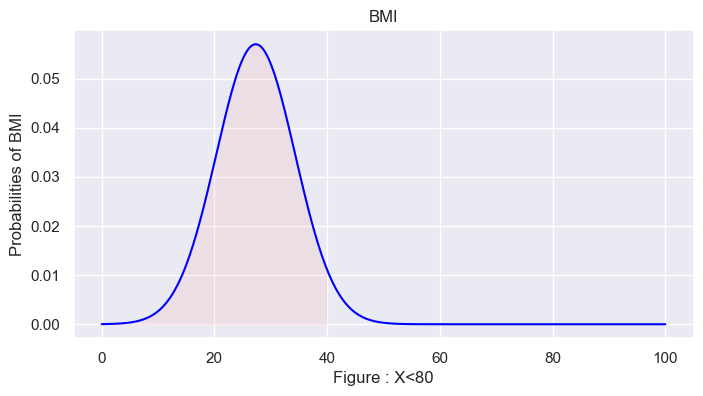

In [290]:
plt.figure(figsize=(8,4))
plt.plot(x, pdf_values, label = 'Customer_Satisfaction_Score', color = 'blue')


plt.fill_between(x, pdf_values, where = (x<40), color = 'red', alpha = 0.05, label = 'X <40')

plt.title('BMI')
plt.xlabel('Figure : X<80')
plt.ylabel('Probabilities of BMI')
plt.grid(True)
plt.show()

### Statistical Feature Selection (Categorical Vs Continuous) using ANOVA test

In [291]:
column_names = healthcare_data.columns.tolist()
print(column_names)

['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'Smoker', 'PhysicalActivity', 'SleepTime', 'MedicalHistoryScore', 'IncomeLevel', 'StressLevel', 'HealthIns', 'Disease_Encoded', 'Cluster']


In [292]:
from scipy.stats import f_oneway

def FunctionAnova(inpData, TargetVariable, ContinuousPredictorList):

    SelectedPredictors=[]
    
    print('ANOVA:\n')
    for predictor in ContinuousPredictorList:
        CategoryGroupLists = [inpData[inpData[TargetVariable] == category][predictor] for category in inpData[TargetVariable].unique()]
        AnovaResults = f_oneway(*CategoryGroupLists)
        
        if (AnovaResults[1] < 0.05):            #(assuming that p_value is smaler than 0.05)
            print(predictor, 'is correlated with', TargetVariable, '| P-Value:', AnovaResults[1])
            SelectedPredictors.append(predictor)
        else:
            print(predictor, 'Not correlated with: ', TargetVariable, '| P-Value:', AnovaResults[1])
    return SelectedPredictors

In [293]:
ContinuousVariables=['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'SleepTime', 'MedicalHistoryScore']
FunctionAnova(inpData=healthcare_data, TargetVariable='Disease_Encoded', ContinuousPredictorList=ContinuousVariables)

ANOVA:

Age Not correlated with:  Disease_Encoded | P-Value: 0.6933612702411478
BMI Not correlated with:  Disease_Encoded | P-Value: 0.17549701951687935
BloodPressure Not correlated with:  Disease_Encoded | P-Value: 0.9719707032752248
Cholesterol Not correlated with:  Disease_Encoded | P-Value: 0.8945667809848713
Glucose Not correlated with:  Disease_Encoded | P-Value: 0.06466531887553585
Insulin Not correlated with:  Disease_Encoded | P-Value: 0.7299404000650758
HeartRate Not correlated with:  Disease_Encoded | P-Value: 0.17737871280259324
SleepTime Not correlated with:  Disease_Encoded | P-Value: 0.19110454453875295
MedicalHistoryScore Not correlated with:  Disease_Encoded | P-Value: 0.42857536352027104


[]

Although some of the independent variables have a normal distribution, they do not have a significant correlation of variance, as all the p_values are greater than the significance level of 0.05. This therefore suggests that there is no strong significant impact/influence associated with the types of Diseases.

### Hypothesis:

In [294]:
healthcare_data.describe()

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease_Encoded,Cluster
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,48.805600,27.332873,129.749053,199.611158,137.440600,146.573200,80.342000,0.510400,1.003600,7.482200,4.485400,0.995800,0.986000,0.501200,1.503200,0.478400
std,17.906991,7.008076,27.945382,56.700345,47.448072,82.623127,13.914919,0.499942,0.806546,2.281562,2.852405,0.817506,0.815069,0.500049,1.118141,0.499583
min,18.000000,15.000291,80.000000,100.000000,70.000000,15.000000,60.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34.000000,21.398311,106.000000,151.000000,103.000000,78.000000,70.000000,0.000000,0.000000,5.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,49.000000,27.332873,129.749053,199.611158,136.000000,144.000000,80.000000,1.000000,1.000000,7.000000,4.000000,1.000000,1.000000,1.000000,1.500000,0.000000
75%,64.000000,33.181997,154.000000,247.000000,167.000000,213.000000,89.000000,1.000000,2.000000,9.000000,7.000000,2.000000,2.000000,1.000000,3.000000,1.000000
max,79.000000,39.988943,179.000000,299.000000,582.000000,744.000000,198.000000,1.000000,2.000000,11.000000,9.000000,2.000000,2.000000,1.000000,3.000000,1.000000


### BloodPressure:

In [295]:
from statsmodels.stats import weightstats

X = healthcare_data['BloodPressure']
mu = 125

In [296]:
z_score, p_value = weightstats.ztest(X, value = mu, ddof = 1, alternative = 'two-sided')
z_score

12.016609205876323

#### As I know the Sigma the std of the population, then we can go through with the Degrees of freedom:

#### H0: mu = 125 // H1: mu > 125
#### mu = 25 (defining the population average)

In [297]:
p_value

2.906557094085278e-33

As the p_value is greater than alpha(0.05%) we do not reject the Null Hypothesis. We are firming that at a 5% of significance level, we have evidence to say that the average of BloodPressure is around 125

### Cholesterol

Creating a hypothesis test for CHolesterol and creating a scenario that the average is greater than 160:

H0: mu = 160 // H1: mu > 160

In [298]:
mu1 = 160

In [299]:
z_score1, p_value1 = weightstats.ztest(X, value = mu1, ddof = 1, alternative = 'larger')
z_score1

-76.54449020350981

In [300]:
p_value1

1.0

we accept the Null Hypothesis because the p_value is greater than alpha

### Blood Pressure:

#### Creating a scenario that we wanna know if the BloodPressure average of the population is around 100

In [301]:
from scipy import stats

mu2 = 100

In [302]:
t_score, p_value2 = stats.ttest_1samp(X, mu2)
t_score

75.27453735543784

In [303]:
p_value2 

0.0

#### At a 5% of significance level we have enough results that the average is smaler than alpha, so we reject the Null hypoteshis

In [304]:
column_names = healthcare_data.columns.tolist()

column_names

['Age',
 'BMI',
 'BloodPressure',
 'Cholesterol',
 'Glucose',
 'Insulin',
 'HeartRate',
 'Smoker',
 'PhysicalActivity',
 'SleepTime',
 'MedicalHistoryScore',
 'IncomeLevel',
 'StressLevel',
 'HealthIns',
 'Disease_Encoded',
 'Cluster']

In [305]:
health_metrics = ['Age', 'BMI', 'BloodPressure', 'Cholesterol', 'Glucose', 'Insulin', 'HeartRate', 'Smoker', 'PhysicalActivity', 'SleepTime', 'MedicalHistoryScore', 'IncomeLevel', 'StressLevel', 'HealthIns']
outcome = 'Disease_Encoded'

correlations_matrix = healthcare_data[health_metrics + [outcome]].corr()

print(correlations_matrix)

                          Age       BMI  BloodPressure  Cholesterol   Glucose  \
Age                  1.000000  0.006073       0.002387     0.013543 -0.008970   
BMI                  0.006073  1.000000       0.008701    -0.004632  0.003687   
BloodPressure        0.002387  0.008701       1.000000     0.005510  0.000854   
Cholesterol          0.013543 -0.004632       0.005510     1.000000  0.019629   
Glucose             -0.008970  0.003687       0.000854     0.019629  1.000000   
Insulin             -0.011563 -0.017665       0.023252     0.000598 -0.040680   
HeartRate            0.002166  0.008519       0.006151    -0.007852 -0.005826   
Smoker              -0.030431 -0.014116      -0.014758    -0.017775  0.028913   
PhysicalActivity    -0.038442 -0.005279      -0.006064    -0.035001 -0.017432   
SleepTime           -0.000775  0.003814      -0.006147     0.028295 -0.002268   
MedicalHistoryScore  0.025354  0.008235      -0.003690     0.006619 -0.001143   
IncomeLevel         -0.00284

In [306]:
correlation_data = {
    'Age': 1.000000,
    'BMI': 0.029683,
    'BloodPressure': 0.005053,
    'Cholesterol': -0.008025,
    'Glucose': -0.010865,
    'Insulin': 0.011233,
    'HeartRate': 0.021092,
    'Smoker': 0.002445,
    'PhysicalActivity': -0.001122,
    'SleepTime': -0.021816,
    'MedicalHistoryScore': -0.009550,
    'IncomeLevel': -0.002721,
    'StressLevel': 0.013219,
    'HealthIns': -0.006447,
    'Disease_Encoded': 1.000000
}

del correlation_data['Disease_Encoded']

top_positive_correlations = sorted(correlation_data.items(), key=lambda x: x[1], reverse=True)[:5]

top_negative_correlations = sorted(correlation_data.items(), key=lambda x: x[1])[:5]

print("Top 5 correlações positivas com 'Disease_Encoded':")
for var, corr in top_positive_correlations:
    print(f"{var}: {corr}")

print("\nTop 5 correlações negativas com 'Disease_Encoded':")
for var, corr in top_negative_correlations:
    print(f"{var}: {corr}")

Top 5 correlações positivas com 'Disease_Encoded':
Age: 1.0
BMI: 0.029683
HeartRate: 0.021092
StressLevel: 0.013219
Insulin: 0.011233

Top 5 correlações negativas com 'Disease_Encoded':
SleepTime: -0.021816
Glucose: -0.010865
MedicalHistoryScore: -0.00955
Cholesterol: -0.008025
HealthIns: -0.006447


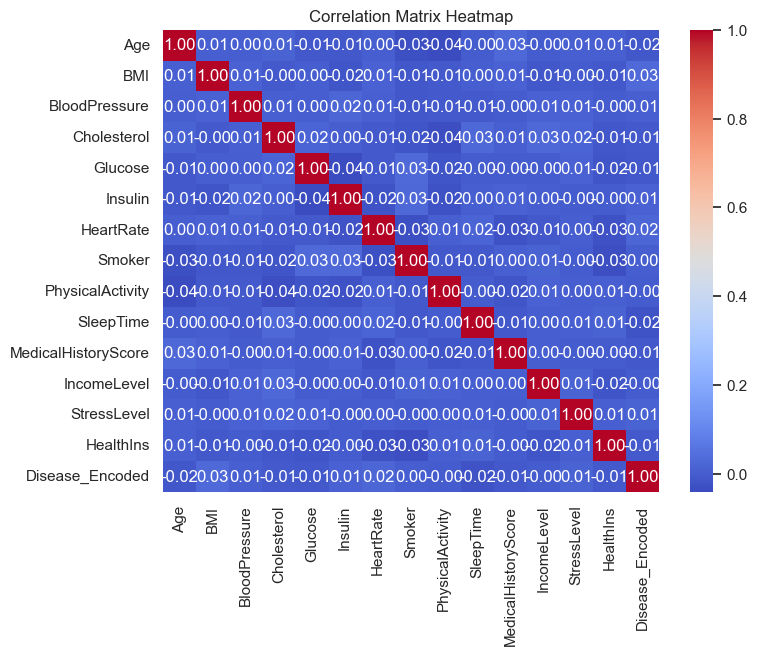

In [307]:
plt.figure(figsize=(8, 6))
sns.heatmap(correlations_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()